# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
import numpy as np

In [2]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

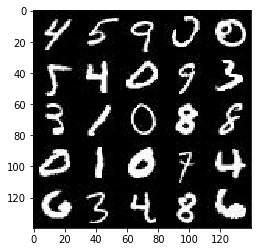

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

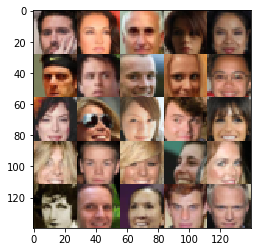

In [4]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [5]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

/home/vladhc/.local/bin/miniconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


TensorFlow Version: 1.7.0
Default GPU Device: /device:GPU:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [6]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    real_input = tf.placeholder(tf.float32,
                                shape=(None, image_height, image_width, image_channels),
                                name='real_images_input')
    z = tf.placeholder(tf.float32,
                       shape=(None, z_dim),
                       name='z_input')
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')

    return real_input, z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [7]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    with tf.variable_scope('discriminator', reuse=reuse):
        
        # batch x 28 x 28 x chan
        
        alpha = tf.constant(0.02, name='alpha')
        
        x = tf.layers.conv2d(images, 64, 5, strides=2, padding='SAME', use_bias=False)
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.nn.leaky_relu(x, alpha)
        
        # batch x 14 x 14 x 64
        
        x = tf.layers.conv2d(x, 128, 5, strides=2, padding='SAME', use_bias=False)
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.nn.leaky_relu(x, alpha)
        
        # batch x 7 x 7 x 128
        
        x = tf.layers.conv2d(x, 256, 7, strides=1, padding='VALID', use_bias=False)
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.nn.leaky_relu(x, alpha)
        
        # batch x 1 x 1 x 256
        
        x = tf.reshape(x, [-1, 256])
        
        # batch x 256
        
        logits = tf.layers.dense(x, 1)
        outputs = tf.nn.softmax(logits)

    return outputs, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [8]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    
    with tf.variable_scope('generator', reuse=(not is_train)):
        
        alpha = tf.constant(0.02, name='alpha')
        
        x = tf.layers.dense(z, 256)
        x = tf.reshape(x, [-1, 1, 1, 256])
        
        # batch x 1 x 1 x 256
        
        x = tf.layers.conv2d_transpose(x, 128, 7, strides=1, padding='VALID', use_bias=False)
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.nn.leaky_relu(x, alpha)
        
        # batch x 7 x 7 x 128
        
        x = tf.layers.conv2d_transpose(x, 64, 5, strides=2, padding='SAME', use_bias=False)
        x = tf.layers.batch_normalization(x, training=is_train)
        x = tf.nn.leaky_relu(x, alpha)
        
        # batch x 14 x 14 x 64
        
        x = tf.layers.conv2d_transpose(x, out_channel_dim, 5, strides=2, padding='SAME')
        out = tf.tanh(x)
        
        # batch x 28 x 28 x chan
    
    return x


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [9]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    
    input_fake = generator(input_z, out_channel_dim, is_train=True)
    
    d_real_out, d_real_logits = discriminator(input_real, reuse=False)
    d_fake_out, d_fake_logits = discriminator(input_fake, reuse=True)
    
    d_real_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            labels=tf.ones_like(d_real_logits),
            logits=d_real_logits))
    
    d_fake_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            labels=tf.zeros_like(d_fake_logits),
            logits=d_fake_logits))
        
    d_loss = d_real_loss + d_fake_loss
    
    gen_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            labels=tf.ones_like(d_fake_logits),
            logits=d_fake_logits))
    
    return d_loss, gen_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [10]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    d_vars = tf.trainable_variables(scope='discriminator')
    g_vars = tf.trainable_variables(scope='generator')
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [12]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """

    print('data_shape', data_shape)
    print('z_dim', z_dim)
    print_every = 10
    show_every = 100
    show_images_count = 25
    
    # tf.reset_default_graph()
    
    _, width, height, channels = data_shape
    real_input, z, learning_rate_placeholder = model_inputs(width, height, channels, z_dim)
    d_loss_op, g_loss_op = model_loss(real_input, z, channels)
    d_train, g_train = model_opt(d_loss_op, g_loss_op, learning_rate_placeholder, beta1)
    
    d_stat_op = tf.summary.scalar('discriminator_loss', d_loss_op, family='losses')
    g_stat_op = tf.summary.scalar('generator_loss', g_loss_op, family='losses')
    
    saver = tf.train.Saver()
    steps = 0
    
    with tf.Session() as sess:
        stat_writer = tf.summary.FileWriter('./logs', sess.graph)
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                
                steps += 1
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                feed_dict = {
                    real_input: batch_images,
                    z: batch_z,
                    learning_rate_placeholder: learning_rate,
                }
                
                _, d_stat, d_loss = sess.run([d_train, d_stat_op, d_loss_op], feed_dict=feed_dict)
                _, g_stat, g_loss = sess.run([g_train, g_stat_op, g_loss_op], feed_dict=feed_dict)
                
                stat_writer.add_summary(d_stat, steps)
                stat_writer.add_summary(g_stat, steps)
                
                if steps % print_every == 0:
                    print("Epoch {}/{}...".format(epoch_i+1, epoch_count),
                          "Discriminator Loss: {:.4f}...".format(d_loss),
                          "Generator Loss: {:.4f}".format(g_loss))

                if steps % show_every == 0:
                    show_generator_output(sess, show_images_count, z, channels, data_image_mode)
                
            saver.save(sess, './checkpoints/generator-{}.ckpt'.format(epoch_i))
            
        stat_writer.flush()

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

data_shape (60000, 28, 28, 1)
z_dim 100
Epoch 1/2... Discriminator Loss: 1.3923... Generator Loss: 0.8606
Epoch 1/2... Discriminator Loss: 1.1349... Generator Loss: 0.9663
Epoch 1/2... Discriminator Loss: 1.1778... Generator Loss: 1.0297
Epoch 1/2... Discriminator Loss: 1.0341... Generator Loss: 1.1431
Epoch 1/2... Discriminator Loss: 0.8986... Generator Loss: 1.2265
Epoch 1/2... Discriminator Loss: 0.9976... Generator Loss: 1.1551
Epoch 1/2... Discriminator Loss: 0.8146... Generator Loss: 1.3548
Epoch 1/2... Discriminator Loss: 0.7782... Generator Loss: 1.4380
Epoch 1/2... Discriminator Loss: 0.6328... Generator Loss: 1.8037
Epoch 1/2... Discriminator Loss: 0.6389... Generator Loss: 1.4578


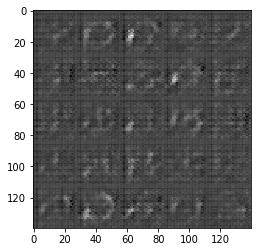

Epoch 1/2... Discriminator Loss: 0.8906... Generator Loss: 1.5853
Epoch 1/2... Discriminator Loss: 0.7865... Generator Loss: 2.0580
Epoch 1/2... Discriminator Loss: 0.8617... Generator Loss: 1.5620
Epoch 1/2... Discriminator Loss: 0.6292... Generator Loss: 1.8794
Epoch 1/2... Discriminator Loss: 0.8637... Generator Loss: 1.4586
Epoch 1/2... Discriminator Loss: 0.7392... Generator Loss: 1.7612
Epoch 1/2... Discriminator Loss: 0.6185... Generator Loss: 1.8381
Epoch 1/2... Discriminator Loss: 0.8604... Generator Loss: 1.5303
Epoch 1/2... Discriminator Loss: 0.6491... Generator Loss: 1.6475
Epoch 1/2... Discriminator Loss: 0.7925... Generator Loss: 1.8148


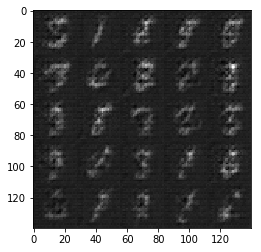

Epoch 1/2... Discriminator Loss: 0.5365... Generator Loss: 2.2590
Epoch 1/2... Discriminator Loss: 0.6657... Generator Loss: 2.2056
Epoch 1/2... Discriminator Loss: 0.7225... Generator Loss: 1.9483
Epoch 1/2... Discriminator Loss: 0.5704... Generator Loss: 2.2268
Epoch 1/2... Discriminator Loss: 0.5852... Generator Loss: 2.1349
Epoch 1/2... Discriminator Loss: 0.5815... Generator Loss: 2.0726
Epoch 1/2... Discriminator Loss: 0.4084... Generator Loss: 2.3987
Epoch 1/2... Discriminator Loss: 0.4021... Generator Loss: 2.7734
Epoch 1/2... Discriminator Loss: 0.4011... Generator Loss: 2.6857
Epoch 1/2... Discriminator Loss: 0.2827... Generator Loss: 2.5639


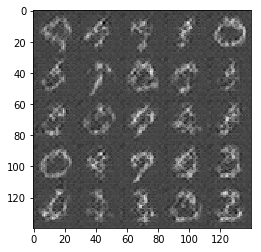

Epoch 1/2... Discriminator Loss: 0.4103... Generator Loss: 2.3044
Epoch 1/2... Discriminator Loss: 0.3220... Generator Loss: 3.3009
Epoch 1/2... Discriminator Loss: 0.3923... Generator Loss: 2.8779
Epoch 1/2... Discriminator Loss: 0.6097... Generator Loss: 3.1467
Epoch 1/2... Discriminator Loss: 0.6370... Generator Loss: 2.5408
Epoch 1/2... Discriminator Loss: 0.2530... Generator Loss: 3.0880
Epoch 1/2... Discriminator Loss: 0.2479... Generator Loss: 3.3175
Epoch 1/2... Discriminator Loss: 0.3271... Generator Loss: 4.0301
Epoch 1/2... Discriminator Loss: 0.3362... Generator Loss: 2.9722
Epoch 1/2... Discriminator Loss: 0.2178... Generator Loss: 3.0227


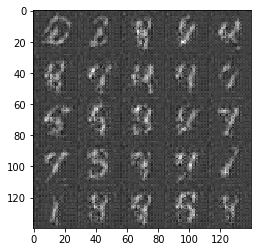

Epoch 1/2... Discriminator Loss: 0.4555... Generator Loss: 2.4389
Epoch 1/2... Discriminator Loss: 0.2636... Generator Loss: 3.0520
Epoch 1/2... Discriminator Loss: 0.2748... Generator Loss: 3.1271
Epoch 1/2... Discriminator Loss: 0.2007... Generator Loss: 3.6309
Epoch 1/2... Discriminator Loss: 1.4813... Generator Loss: 4.0164
Epoch 1/2... Discriminator Loss: 0.6158... Generator Loss: 3.4400
Epoch 1/2... Discriminator Loss: 0.3890... Generator Loss: 3.5198
Epoch 1/2... Discriminator Loss: 0.2332... Generator Loss: 3.0014
Epoch 1/2... Discriminator Loss: 0.6557... Generator Loss: 3.1897
Epoch 1/2... Discriminator Loss: 0.4545... Generator Loss: 3.9462


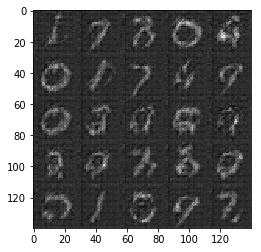

Epoch 1/2... Discriminator Loss: 0.2453... Generator Loss: 3.2888
Epoch 1/2... Discriminator Loss: 0.1580... Generator Loss: 3.0349
Epoch 1/2... Discriminator Loss: 0.3701... Generator Loss: 3.7663
Epoch 1/2... Discriminator Loss: 0.4481... Generator Loss: 3.1769
Epoch 1/2... Discriminator Loss: 0.1783... Generator Loss: 3.8532
Epoch 1/2... Discriminator Loss: 0.2508... Generator Loss: 3.3661
Epoch 1/2... Discriminator Loss: 0.3121... Generator Loss: 3.9712
Epoch 1/2... Discriminator Loss: 0.3872... Generator Loss: 2.8816
Epoch 1/2... Discriminator Loss: 0.2188... Generator Loss: 4.4432
Epoch 1/2... Discriminator Loss: 0.2632... Generator Loss: 4.0870


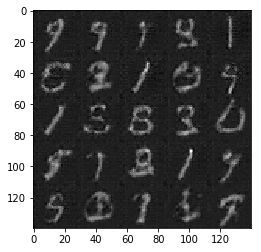

Epoch 1/2... Discriminator Loss: 0.1784... Generator Loss: 3.9852
Epoch 1/2... Discriminator Loss: 0.2897... Generator Loss: 2.8266
Epoch 1/2... Discriminator Loss: 0.3584... Generator Loss: 3.5975
Epoch 1/2... Discriminator Loss: 0.4197... Generator Loss: 3.6221
Epoch 1/2... Discriminator Loss: 0.3761... Generator Loss: 2.9447
Epoch 1/2... Discriminator Loss: 0.5058... Generator Loss: 3.7968
Epoch 1/2... Discriminator Loss: 0.3971... Generator Loss: 3.7326
Epoch 1/2... Discriminator Loss: 0.2679... Generator Loss: 3.1841
Epoch 1/2... Discriminator Loss: 0.2047... Generator Loss: 3.9388
Epoch 1/2... Discriminator Loss: 0.3858... Generator Loss: 2.5483


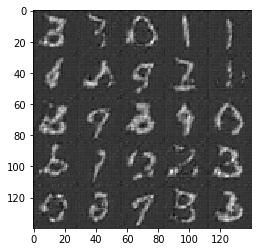

Epoch 1/2... Discriminator Loss: 0.4346... Generator Loss: 2.5200
Epoch 1/2... Discriminator Loss: 0.3078... Generator Loss: 3.3138
Epoch 1/2... Discriminator Loss: 0.3556... Generator Loss: 2.7420
Epoch 1/2... Discriminator Loss: 0.1529... Generator Loss: 3.3169
Epoch 1/2... Discriminator Loss: 0.2263... Generator Loss: 3.9309
Epoch 1/2... Discriminator Loss: 1.0732... Generator Loss: 5.1969
Epoch 1/2... Discriminator Loss: 0.5769... Generator Loss: 2.7025
Epoch 1/2... Discriminator Loss: 0.2474... Generator Loss: 3.6475
Epoch 1/2... Discriminator Loss: 0.1248... Generator Loss: 4.2872
Epoch 1/2... Discriminator Loss: 0.2108... Generator Loss: 3.6948


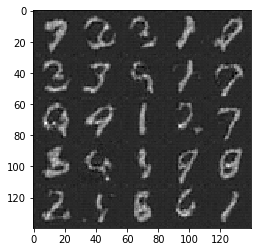

Epoch 1/2... Discriminator Loss: 0.2960... Generator Loss: 2.8241
Epoch 1/2... Discriminator Loss: 0.2598... Generator Loss: 3.5586
Epoch 1/2... Discriminator Loss: 0.7886... Generator Loss: 3.7483
Epoch 1/2... Discriminator Loss: 0.2611... Generator Loss: 3.4270
Epoch 1/2... Discriminator Loss: 0.2802... Generator Loss: 3.9157
Epoch 1/2... Discriminator Loss: 0.3700... Generator Loss: 2.9876
Epoch 1/2... Discriminator Loss: 0.5078... Generator Loss: 3.9358
Epoch 1/2... Discriminator Loss: 0.1540... Generator Loss: 3.8935
Epoch 1/2... Discriminator Loss: 0.2327... Generator Loss: 3.2527
Epoch 1/2... Discriminator Loss: 0.2491... Generator Loss: 4.2450


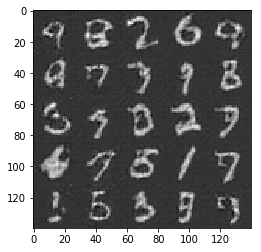

Epoch 1/2... Discriminator Loss: 0.5331... Generator Loss: 3.4587
Epoch 1/2... Discriminator Loss: 0.2454... Generator Loss: 3.3700
Epoch 1/2... Discriminator Loss: 0.2090... Generator Loss: 3.6113
Epoch 2/2... Discriminator Loss: 0.1436... Generator Loss: 3.6126
Epoch 2/2... Discriminator Loss: 0.2950... Generator Loss: 4.5322
Epoch 2/2... Discriminator Loss: 0.1977... Generator Loss: 3.7703
Epoch 2/2... Discriminator Loss: 0.2569... Generator Loss: 3.4161
Epoch 2/2... Discriminator Loss: 0.1867... Generator Loss: 3.3875
Epoch 2/2... Discriminator Loss: 0.2235... Generator Loss: 4.3087
Epoch 2/2... Discriminator Loss: 0.3189... Generator Loss: 4.4704


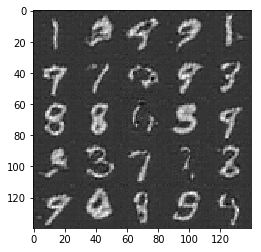

Epoch 2/2... Discriminator Loss: 0.2246... Generator Loss: 3.5998
Epoch 2/2... Discriminator Loss: 0.2347... Generator Loss: 3.2490
Epoch 2/2... Discriminator Loss: 0.3086... Generator Loss: 4.7652
Epoch 2/2... Discriminator Loss: 0.1086... Generator Loss: 4.4706
Epoch 2/2... Discriminator Loss: 0.0938... Generator Loss: 4.2670
Epoch 2/2... Discriminator Loss: 0.3212... Generator Loss: 3.5940
Epoch 2/2... Discriminator Loss: 0.3479... Generator Loss: 4.1034
Epoch 2/2... Discriminator Loss: 0.2037... Generator Loss: 5.2217
Epoch 2/2... Discriminator Loss: 0.2151... Generator Loss: 3.6706
Epoch 2/2... Discriminator Loss: 0.2036... Generator Loss: 4.9614


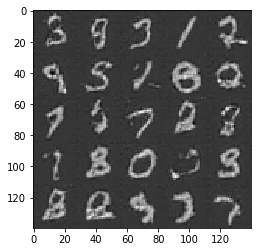

Epoch 2/2... Discriminator Loss: 0.1521... Generator Loss: 3.7216
Epoch 2/2... Discriminator Loss: 0.1636... Generator Loss: 3.9148
Epoch 2/2... Discriminator Loss: 0.1607... Generator Loss: 3.4088
Epoch 2/2... Discriminator Loss: 0.1698... Generator Loss: 4.5589
Epoch 2/2... Discriminator Loss: 0.2545... Generator Loss: 4.8938
Epoch 2/2... Discriminator Loss: 0.3054... Generator Loss: 4.7833
Epoch 2/2... Discriminator Loss: 0.2012... Generator Loss: 3.5963
Epoch 2/2... Discriminator Loss: 0.3415... Generator Loss: 2.6912
Epoch 2/2... Discriminator Loss: 0.2442... Generator Loss: 4.3759
Epoch 2/2... Discriminator Loss: 0.0917... Generator Loss: 4.7812


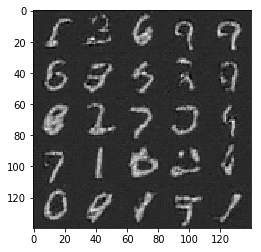

Epoch 2/2... Discriminator Loss: 0.1178... Generator Loss: 4.0465
Epoch 2/2... Discriminator Loss: 0.0688... Generator Loss: 4.6529
Epoch 2/2... Discriminator Loss: 0.1381... Generator Loss: 3.6428
Epoch 2/2... Discriminator Loss: 0.1100... Generator Loss: 3.9006
Epoch 2/2... Discriminator Loss: 0.0721... Generator Loss: 4.8975
Epoch 2/2... Discriminator Loss: 0.3553... Generator Loss: 3.1792
Epoch 2/2... Discriminator Loss: 0.2422... Generator Loss: 3.2186
Epoch 2/2... Discriminator Loss: 0.2262... Generator Loss: 3.9802
Epoch 2/2... Discriminator Loss: 0.1741... Generator Loss: 3.4675
Epoch 2/2... Discriminator Loss: 0.0876... Generator Loss: 4.4446


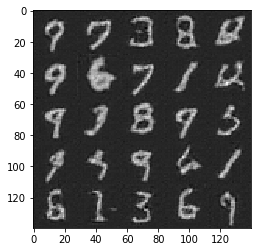

Epoch 2/2... Discriminator Loss: 0.3286... Generator Loss: 5.3424
Epoch 2/2... Discriminator Loss: 0.0771... Generator Loss: 3.9111
Epoch 2/2... Discriminator Loss: 0.2392... Generator Loss: 3.7662
Epoch 2/2... Discriminator Loss: 0.5064... Generator Loss: 2.9250
Epoch 2/2... Discriminator Loss: 0.3407... Generator Loss: 4.2724
Epoch 2/2... Discriminator Loss: 0.3635... Generator Loss: 3.3231
Epoch 2/2... Discriminator Loss: 0.2221... Generator Loss: 3.6620
Epoch 2/2... Discriminator Loss: 0.1394... Generator Loss: 3.5970
Epoch 2/2... Discriminator Loss: 0.2195... Generator Loss: 3.5423
Epoch 2/2... Discriminator Loss: 0.3489... Generator Loss: 3.1704


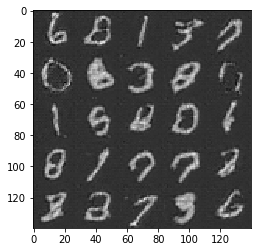

Epoch 2/2... Discriminator Loss: 0.2208... Generator Loss: 4.1329
Epoch 2/2... Discriminator Loss: 0.2105... Generator Loss: 3.6390
Epoch 2/2... Discriminator Loss: 0.1068... Generator Loss: 4.3633
Epoch 2/2... Discriminator Loss: 0.1401... Generator Loss: 3.9380
Epoch 2/2... Discriminator Loss: 0.4150... Generator Loss: 4.1946
Epoch 2/2... Discriminator Loss: 0.3220... Generator Loss: 3.0905
Epoch 2/2... Discriminator Loss: 0.1383... Generator Loss: 4.5774
Epoch 2/2... Discriminator Loss: 0.1752... Generator Loss: 3.6581
Epoch 2/2... Discriminator Loss: 0.1249... Generator Loss: 4.4455
Epoch 2/2... Discriminator Loss: 0.1121... Generator Loss: 4.2643


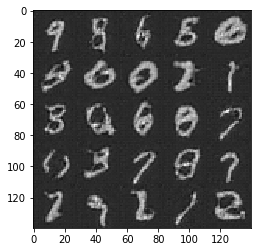

Epoch 2/2... Discriminator Loss: 0.0672... Generator Loss: 4.6293
Epoch 2/2... Discriminator Loss: 0.0519... Generator Loss: 4.6633
Epoch 2/2... Discriminator Loss: 0.1124... Generator Loss: 5.1884
Epoch 2/2... Discriminator Loss: 0.1302... Generator Loss: 4.0363
Epoch 2/2... Discriminator Loss: 0.1156... Generator Loss: 4.6516
Epoch 2/2... Discriminator Loss: 0.0834... Generator Loss: 4.0150
Epoch 2/2... Discriminator Loss: 0.3446... Generator Loss: 4.7080
Epoch 2/2... Discriminator Loss: 0.1675... Generator Loss: 4.0246
Epoch 2/2... Discriminator Loss: 0.2568... Generator Loss: 3.6409
Epoch 2/2... Discriminator Loss: 0.3822... Generator Loss: 4.8909


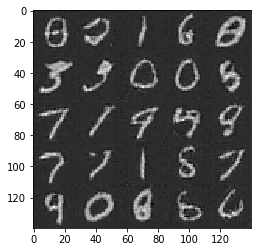

Epoch 2/2... Discriminator Loss: 0.1406... Generator Loss: 4.8301
Epoch 2/2... Discriminator Loss: 0.1244... Generator Loss: 4.4170
Epoch 2/2... Discriminator Loss: 0.1029... Generator Loss: 4.4332
Epoch 2/2... Discriminator Loss: 0.1319... Generator Loss: 4.8464
Epoch 2/2... Discriminator Loss: 0.1582... Generator Loss: 5.4851
Epoch 2/2... Discriminator Loss: 0.1625... Generator Loss: 4.8683
Epoch 2/2... Discriminator Loss: 0.1541... Generator Loss: 5.4166
Epoch 2/2... Discriminator Loss: 0.0757... Generator Loss: 4.9085
Epoch 2/2... Discriminator Loss: 0.0381... Generator Loss: 4.9717
Epoch 2/2... Discriminator Loss: 0.0823... Generator Loss: 4.1153


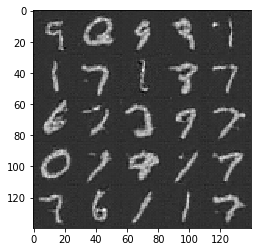

Epoch 2/2... Discriminator Loss: 0.1882... Generator Loss: 4.9180
Epoch 2/2... Discriminator Loss: 0.0749... Generator Loss: 4.8236
Epoch 2/2... Discriminator Loss: 0.0808... Generator Loss: 4.2692
Epoch 2/2... Discriminator Loss: 0.0806... Generator Loss: 5.1761
Epoch 2/2... Discriminator Loss: 0.0828... Generator Loss: 4.9733
Epoch 2/2... Discriminator Loss: 0.0720... Generator Loss: 4.6347
Epoch 2/2... Discriminator Loss: 0.6068... Generator Loss: 4.0163
Epoch 2/2... Discriminator Loss: 0.2900... Generator Loss: 2.8042
Epoch 2/2... Discriminator Loss: 0.1681... Generator Loss: 4.8482
Epoch 2/2... Discriminator Loss: 0.1514... Generator Loss: 4.0975


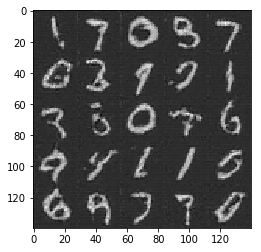

Epoch 2/2... Discriminator Loss: 0.2082... Generator Loss: 5.4054
Epoch 2/2... Discriminator Loss: 0.0886... Generator Loss: 5.3665
Epoch 2/2... Discriminator Loss: 1.2760... Generator Loss: 5.1152
Epoch 2/2... Discriminator Loss: 0.2032... Generator Loss: 3.6956
Epoch 2/2... Discriminator Loss: 0.2733... Generator Loss: 3.2191
Epoch 2/2... Discriminator Loss: 0.4819... Generator Loss: 4.6092
Epoch 2/2... Discriminator Loss: 0.2213... Generator Loss: 3.7546


In [13]:
batch_size = 64
z_dim = 100
learning_rate = 0.002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

data_shape (202599, 28, 28, 3)
z_dim 100
Epoch 1/5... Discriminator Loss: 1.3430... Generator Loss: 0.7587
Epoch 1/5... Discriminator Loss: 1.2860... Generator Loss: 0.8192
Epoch 1/5... Discriminator Loss: 1.3235... Generator Loss: 0.8674
Epoch 1/5... Discriminator Loss: 1.2978... Generator Loss: 0.8858
Epoch 1/5... Discriminator Loss: 1.3826... Generator Loss: 0.8443
Epoch 1/5... Discriminator Loss: 1.3013... Generator Loss: 0.8657
Epoch 1/5... Discriminator Loss: 1.4062... Generator Loss: 0.8171
Epoch 1/5... Discriminator Loss: 1.4013... Generator Loss: 0.8066
Epoch 1/5... Discriminator Loss: 1.3908... Generator Loss: 0.8244
Epoch 1/5... Discriminator Loss: 1.3527... Generator Loss: 0.8003


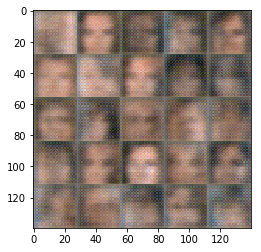

Epoch 1/5... Discriminator Loss: 1.3110... Generator Loss: 0.8243
Epoch 1/5... Discriminator Loss: 1.3520... Generator Loss: 0.8497
Epoch 1/5... Discriminator Loss: 1.4520... Generator Loss: 0.8238
Epoch 1/5... Discriminator Loss: 1.3671... Generator Loss: 0.7705
Epoch 1/5... Discriminator Loss: 1.2412... Generator Loss: 0.8876
Epoch 1/5... Discriminator Loss: 1.3826... Generator Loss: 0.8247
Epoch 1/5... Discriminator Loss: 1.3946... Generator Loss: 0.8238
Epoch 1/5... Discriminator Loss: 1.2567... Generator Loss: 0.8427
Epoch 1/5... Discriminator Loss: 1.3400... Generator Loss: 0.8366
Epoch 1/5... Discriminator Loss: 1.3606... Generator Loss: 0.9430


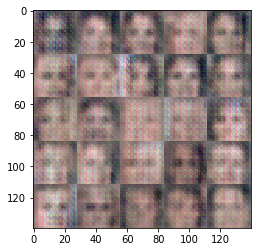

Epoch 1/5... Discriminator Loss: 1.2647... Generator Loss: 0.9729
Epoch 1/5... Discriminator Loss: 1.3391... Generator Loss: 0.8163
Epoch 1/5... Discriminator Loss: 1.3963... Generator Loss: 0.8681
Epoch 1/5... Discriminator Loss: 1.3896... Generator Loss: 0.7948
Epoch 1/5... Discriminator Loss: 1.1697... Generator Loss: 0.9368
Epoch 1/5... Discriminator Loss: 1.3223... Generator Loss: 0.8589
Epoch 1/5... Discriminator Loss: 1.3274... Generator Loss: 0.8426
Epoch 1/5... Discriminator Loss: 1.2972... Generator Loss: 0.8362
Epoch 1/5... Discriminator Loss: 1.2952... Generator Loss: 0.8832
Epoch 1/5... Discriminator Loss: 1.3281... Generator Loss: 0.8545


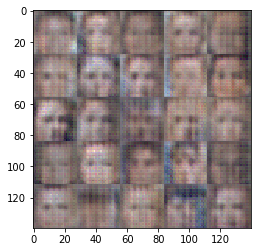

Epoch 1/5... Discriminator Loss: 1.3122... Generator Loss: 0.8207
Epoch 1/5... Discriminator Loss: 1.2771... Generator Loss: 0.8504
Epoch 1/5... Discriminator Loss: 1.1770... Generator Loss: 0.9641
Epoch 1/5... Discriminator Loss: 1.3323... Generator Loss: 0.8657
Epoch 1/5... Discriminator Loss: 1.3261... Generator Loss: 0.8362
Epoch 1/5... Discriminator Loss: 1.3788... Generator Loss: 0.8099
Epoch 1/5... Discriminator Loss: 1.2703... Generator Loss: 0.9070
Epoch 1/5... Discriminator Loss: 1.3253... Generator Loss: 0.8986
Epoch 1/5... Discriminator Loss: 1.3325... Generator Loss: 0.8782
Epoch 1/5... Discriminator Loss: 1.4326... Generator Loss: 0.8875


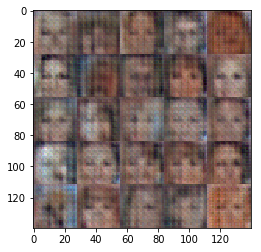

Epoch 1/5... Discriminator Loss: 1.4510... Generator Loss: 0.8435
Epoch 1/5... Discriminator Loss: 1.2562... Generator Loss: 0.9087
Epoch 1/5... Discriminator Loss: 1.2451... Generator Loss: 0.9809
Epoch 1/5... Discriminator Loss: 1.2773... Generator Loss: 0.8884
Epoch 1/5... Discriminator Loss: 1.4484... Generator Loss: 0.9485
Epoch 1/5... Discriminator Loss: 1.3215... Generator Loss: 0.8594
Epoch 1/5... Discriminator Loss: 1.2869... Generator Loss: 0.8911
Epoch 1/5... Discriminator Loss: 1.3379... Generator Loss: 0.9679
Epoch 1/5... Discriminator Loss: 1.3427... Generator Loss: 0.9483
Epoch 1/5... Discriminator Loss: 1.1946... Generator Loss: 1.0748


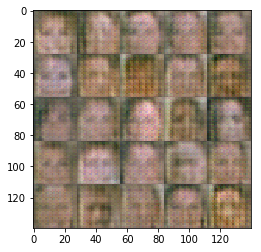

Epoch 1/5... Discriminator Loss: 1.2239... Generator Loss: 0.9116
Epoch 1/5... Discriminator Loss: 1.5188... Generator Loss: 0.9302
Epoch 1/5... Discriminator Loss: 1.1921... Generator Loss: 0.9433
Epoch 1/5... Discriminator Loss: 1.1854... Generator Loss: 1.1408
Epoch 1/5... Discriminator Loss: 1.2315... Generator Loss: 0.9993
Epoch 1/5... Discriminator Loss: 1.1950... Generator Loss: 1.0757
Epoch 1/5... Discriminator Loss: 1.3264... Generator Loss: 0.9429
Epoch 1/5... Discriminator Loss: 1.1853... Generator Loss: 0.9503
Epoch 1/5... Discriminator Loss: 1.1656... Generator Loss: 0.9997
Epoch 1/5... Discriminator Loss: 1.1972... Generator Loss: 1.1456


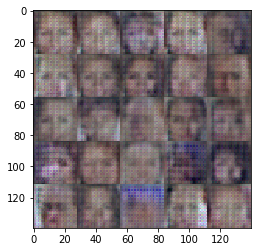

Epoch 1/5... Discriminator Loss: 1.2914... Generator Loss: 1.1215
Epoch 1/5... Discriminator Loss: 1.3568... Generator Loss: 0.9938
Epoch 1/5... Discriminator Loss: 1.1925... Generator Loss: 1.0502
Epoch 1/5... Discriminator Loss: 1.0449... Generator Loss: 1.1020
Epoch 1/5... Discriminator Loss: 1.2145... Generator Loss: 1.1289
Epoch 1/5... Discriminator Loss: 0.9846... Generator Loss: 1.3153
Epoch 1/5... Discriminator Loss: 1.2343... Generator Loss: 1.0705
Epoch 1/5... Discriminator Loss: 1.2495... Generator Loss: 0.9884
Epoch 1/5... Discriminator Loss: 1.2491... Generator Loss: 1.0284
Epoch 1/5... Discriminator Loss: 1.2777... Generator Loss: 1.0230


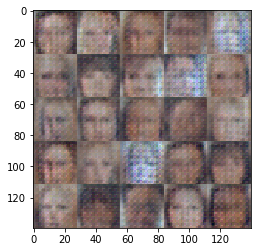

Epoch 1/5... Discriminator Loss: 1.5040... Generator Loss: 0.9212
Epoch 1/5... Discriminator Loss: 1.1551... Generator Loss: 1.1203
Epoch 1/5... Discriminator Loss: 1.5517... Generator Loss: 1.2444
Epoch 1/5... Discriminator Loss: 0.9997... Generator Loss: 1.2499
Epoch 1/5... Discriminator Loss: 1.2271... Generator Loss: 0.9552
Epoch 1/5... Discriminator Loss: 1.1197... Generator Loss: 1.1003
Epoch 1/5... Discriminator Loss: 1.3719... Generator Loss: 0.9425
Epoch 1/5... Discriminator Loss: 1.2839... Generator Loss: 1.1036
Epoch 1/5... Discriminator Loss: 0.9644... Generator Loss: 1.1326
Epoch 1/5... Discriminator Loss: 1.3837... Generator Loss: 1.4304


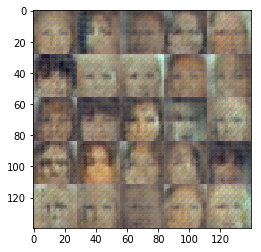

Epoch 1/5... Discriminator Loss: 1.1019... Generator Loss: 1.0817
Epoch 1/5... Discriminator Loss: 1.3494... Generator Loss: 1.4309
Epoch 1/5... Discriminator Loss: 1.4200... Generator Loss: 1.3154
Epoch 1/5... Discriminator Loss: 1.0679... Generator Loss: 1.2163
Epoch 1/5... Discriminator Loss: 0.9101... Generator Loss: 1.3875
Epoch 1/5... Discriminator Loss: 1.4046... Generator Loss: 1.5154
Epoch 1/5... Discriminator Loss: 1.1245... Generator Loss: 1.1186
Epoch 1/5... Discriminator Loss: 1.1911... Generator Loss: 1.1395
Epoch 1/5... Discriminator Loss: 1.4490... Generator Loss: 1.0322
Epoch 1/5... Discriminator Loss: 1.1906... Generator Loss: 1.2625


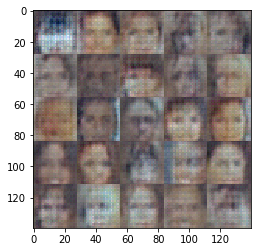

Epoch 1/5... Discriminator Loss: 1.1170... Generator Loss: 1.2848
Epoch 1/5... Discriminator Loss: 1.0117... Generator Loss: 1.3071
Epoch 1/5... Discriminator Loss: 1.1516... Generator Loss: 1.2365
Epoch 1/5... Discriminator Loss: 1.3772... Generator Loss: 1.2230
Epoch 1/5... Discriminator Loss: 1.2716... Generator Loss: 1.1496
Epoch 1/5... Discriminator Loss: 1.0248... Generator Loss: 1.3319
Epoch 1/5... Discriminator Loss: 1.1452... Generator Loss: 1.3656
Epoch 1/5... Discriminator Loss: 1.3778... Generator Loss: 1.1185
Epoch 1/5... Discriminator Loss: 1.3320... Generator Loss: 1.0987
Epoch 1/5... Discriminator Loss: 0.9993... Generator Loss: 1.3729


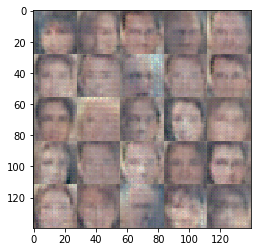

Epoch 1/5... Discriminator Loss: 1.0340... Generator Loss: 1.4211
Epoch 1/5... Discriminator Loss: 1.1878... Generator Loss: 1.1907
Epoch 1/5... Discriminator Loss: 1.0840... Generator Loss: 1.1215
Epoch 1/5... Discriminator Loss: 1.2652... Generator Loss: 1.2543
Epoch 1/5... Discriminator Loss: 1.0960... Generator Loss: 1.1807
Epoch 1/5... Discriminator Loss: 1.3603... Generator Loss: 1.2366
Epoch 1/5... Discriminator Loss: 1.0487... Generator Loss: 1.4110
Epoch 1/5... Discriminator Loss: 1.0692... Generator Loss: 1.4374
Epoch 1/5... Discriminator Loss: 1.0967... Generator Loss: 1.2280
Epoch 1/5... Discriminator Loss: 1.1434... Generator Loss: 1.2470


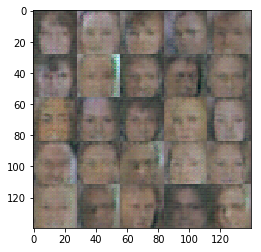

Epoch 1/5... Discriminator Loss: 1.4079... Generator Loss: 1.3597
Epoch 1/5... Discriminator Loss: 1.0538... Generator Loss: 1.3827
Epoch 1/5... Discriminator Loss: 1.1189... Generator Loss: 1.3012
Epoch 1/5... Discriminator Loss: 1.0195... Generator Loss: 1.5247
Epoch 1/5... Discriminator Loss: 1.0781... Generator Loss: 1.3197
Epoch 1/5... Discriminator Loss: 1.0096... Generator Loss: 1.4400
Epoch 1/5... Discriminator Loss: 1.0392... Generator Loss: 1.3638
Epoch 1/5... Discriminator Loss: 1.1055... Generator Loss: 1.2222
Epoch 1/5... Discriminator Loss: 1.2361... Generator Loss: 1.4072
Epoch 1/5... Discriminator Loss: 1.2374... Generator Loss: 1.4585


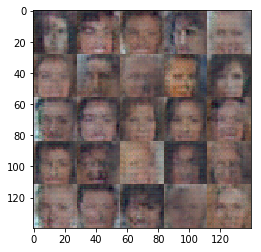

Epoch 1/5... Discriminator Loss: 1.0180... Generator Loss: 1.4926
Epoch 1/5... Discriminator Loss: 0.8796... Generator Loss: 1.4020
Epoch 1/5... Discriminator Loss: 1.2356... Generator Loss: 1.4899
Epoch 1/5... Discriminator Loss: 0.9763... Generator Loss: 1.4035
Epoch 1/5... Discriminator Loss: 0.9655... Generator Loss: 1.4577
Epoch 1/5... Discriminator Loss: 1.1797... Generator Loss: 1.4071
Epoch 1/5... Discriminator Loss: 1.0939... Generator Loss: 1.5379
Epoch 1/5... Discriminator Loss: 0.9176... Generator Loss: 1.4174
Epoch 1/5... Discriminator Loss: 1.2088... Generator Loss: 1.6195
Epoch 1/5... Discriminator Loss: 0.9748... Generator Loss: 1.0782


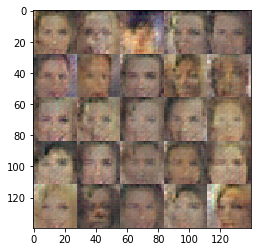

Epoch 1/5... Discriminator Loss: 1.1574... Generator Loss: 1.8543
Epoch 1/5... Discriminator Loss: 1.0307... Generator Loss: 1.4785
Epoch 1/5... Discriminator Loss: 1.1351... Generator Loss: 1.3862
Epoch 1/5... Discriminator Loss: 1.2954... Generator Loss: 1.5149
Epoch 1/5... Discriminator Loss: 0.9553... Generator Loss: 1.5950
Epoch 1/5... Discriminator Loss: 1.2481... Generator Loss: 1.2788
Epoch 1/5... Discriminator Loss: 1.1830... Generator Loss: 1.4970
Epoch 1/5... Discriminator Loss: 0.8809... Generator Loss: 1.5181
Epoch 1/5... Discriminator Loss: 1.1081... Generator Loss: 1.5109
Epoch 1/5... Discriminator Loss: 0.7948... Generator Loss: 1.7614


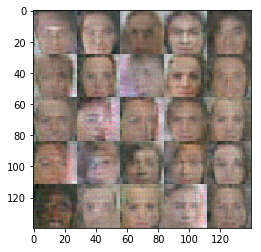

Epoch 1/5... Discriminator Loss: 1.4191... Generator Loss: 1.5358
Epoch 1/5... Discriminator Loss: 0.7867... Generator Loss: 1.6537
Epoch 1/5... Discriminator Loss: 0.8584... Generator Loss: 1.6562
Epoch 1/5... Discriminator Loss: 1.1300... Generator Loss: 1.2418
Epoch 1/5... Discriminator Loss: 0.9116... Generator Loss: 1.1681
Epoch 1/5... Discriminator Loss: 1.1702... Generator Loss: 1.3362
Epoch 1/5... Discriminator Loss: 0.7507... Generator Loss: 1.7024
Epoch 1/5... Discriminator Loss: 0.7492... Generator Loss: 1.6325
Epoch 1/5... Discriminator Loss: 1.1802... Generator Loss: 1.6259
Epoch 1/5... Discriminator Loss: 1.0927... Generator Loss: 1.2582


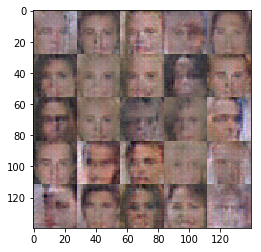

Epoch 1/5... Discriminator Loss: 1.1034... Generator Loss: 1.3652
Epoch 1/5... Discriminator Loss: 0.8889... Generator Loss: 1.2237
Epoch 1/5... Discriminator Loss: 0.8098... Generator Loss: 1.4523
Epoch 1/5... Discriminator Loss: 1.5133... Generator Loss: 1.4737
Epoch 1/5... Discriminator Loss: 1.1300... Generator Loss: 1.5186
Epoch 1/5... Discriminator Loss: 0.9943... Generator Loss: 1.5373
Epoch 1/5... Discriminator Loss: 0.9523... Generator Loss: 1.8176
Epoch 1/5... Discriminator Loss: 0.8557... Generator Loss: 1.2140
Epoch 1/5... Discriminator Loss: 1.0864... Generator Loss: 1.7172
Epoch 1/5... Discriminator Loss: 1.3448... Generator Loss: 1.6439


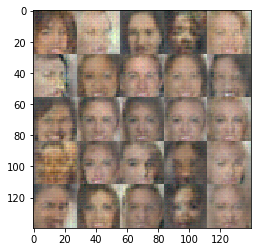

Epoch 1/5... Discriminator Loss: 1.2621... Generator Loss: 1.7033
Epoch 1/5... Discriminator Loss: 1.1633... Generator Loss: 1.4439
Epoch 1/5... Discriminator Loss: 0.7799... Generator Loss: 1.8317
Epoch 1/5... Discriminator Loss: 0.9889... Generator Loss: 1.7934
Epoch 1/5... Discriminator Loss: 1.1415... Generator Loss: 1.3742
Epoch 1/5... Discriminator Loss: 1.0939... Generator Loss: 1.4881
Epoch 1/5... Discriminator Loss: 1.0307... Generator Loss: 1.8625
Epoch 1/5... Discriminator Loss: 1.1446... Generator Loss: 1.6562
Epoch 1/5... Discriminator Loss: 0.8574... Generator Loss: 1.7302
Epoch 1/5... Discriminator Loss: 1.0804... Generator Loss: 1.3908


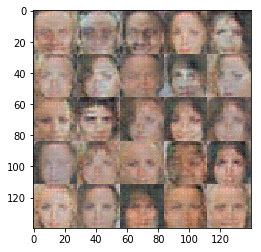

Epoch 1/5... Discriminator Loss: 0.9926... Generator Loss: 1.6005
Epoch 1/5... Discriminator Loss: 1.0811... Generator Loss: 1.6780
Epoch 1/5... Discriminator Loss: 1.0111... Generator Loss: 1.6728
Epoch 1/5... Discriminator Loss: 1.3487... Generator Loss: 1.6197
Epoch 1/5... Discriminator Loss: 0.9100... Generator Loss: 1.3244
Epoch 1/5... Discriminator Loss: 1.0960... Generator Loss: 2.0188
Epoch 1/5... Discriminator Loss: 0.8891... Generator Loss: 1.4017
Epoch 1/5... Discriminator Loss: 1.3408... Generator Loss: 1.3906
Epoch 1/5... Discriminator Loss: 1.0718... Generator Loss: 1.5374
Epoch 1/5... Discriminator Loss: 0.9960... Generator Loss: 1.2317


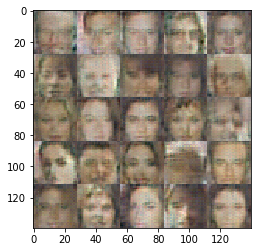

Epoch 1/5... Discriminator Loss: 0.7814... Generator Loss: 1.8179
Epoch 1/5... Discriminator Loss: 0.9695... Generator Loss: 1.7549
Epoch 1/5... Discriminator Loss: 1.3016... Generator Loss: 1.3244
Epoch 1/5... Discriminator Loss: 0.8149... Generator Loss: 1.6012
Epoch 1/5... Discriminator Loss: 1.1238... Generator Loss: 1.8522
Epoch 1/5... Discriminator Loss: 0.9572... Generator Loss: 1.6485
Epoch 1/5... Discriminator Loss: 1.5409... Generator Loss: 1.4302
Epoch 1/5... Discriminator Loss: 1.2294... Generator Loss: 1.4575
Epoch 1/5... Discriminator Loss: 1.0622... Generator Loss: 1.8609
Epoch 1/5... Discriminator Loss: 0.9807... Generator Loss: 1.9027


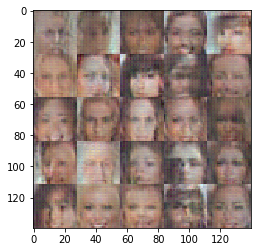

Epoch 1/5... Discriminator Loss: 1.2042... Generator Loss: 1.5405
Epoch 1/5... Discriminator Loss: 1.0733... Generator Loss: 1.7690
Epoch 1/5... Discriminator Loss: 0.8595... Generator Loss: 1.6484
Epoch 1/5... Discriminator Loss: 1.3562... Generator Loss: 1.4009
Epoch 1/5... Discriminator Loss: 0.9566... Generator Loss: 1.7375
Epoch 1/5... Discriminator Loss: 0.9032... Generator Loss: 1.8176
Epoch 1/5... Discriminator Loss: 0.7863... Generator Loss: 1.8140
Epoch 1/5... Discriminator Loss: 1.0055... Generator Loss: 1.7047
Epoch 1/5... Discriminator Loss: 1.0205... Generator Loss: 1.5201
Epoch 1/5... Discriminator Loss: 1.2638... Generator Loss: 1.7681


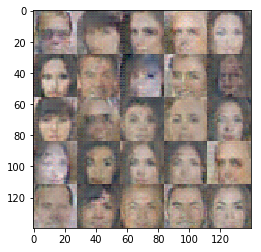

Epoch 1/5... Discriminator Loss: 1.0263... Generator Loss: 1.8189
Epoch 1/5... Discriminator Loss: 1.2894... Generator Loss: 1.3334
Epoch 1/5... Discriminator Loss: 0.6686... Generator Loss: 1.7222
Epoch 1/5... Discriminator Loss: 1.1186... Generator Loss: 1.7536
Epoch 1/5... Discriminator Loss: 1.2647... Generator Loss: 1.7973
Epoch 1/5... Discriminator Loss: 0.8772... Generator Loss: 1.6462
Epoch 1/5... Discriminator Loss: 1.2244... Generator Loss: 1.4387
Epoch 1/5... Discriminator Loss: 1.1505... Generator Loss: 1.6845
Epoch 1/5... Discriminator Loss: 0.8201... Generator Loss: 1.6863
Epoch 1/5... Discriminator Loss: 1.0216... Generator Loss: 1.6890


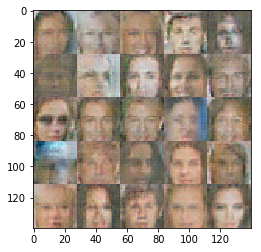

Epoch 1/5... Discriminator Loss: 1.0491... Generator Loss: 1.9585
Epoch 1/5... Discriminator Loss: 0.9134... Generator Loss: 1.6252
Epoch 1/5... Discriminator Loss: 1.2712... Generator Loss: 1.4460
Epoch 1/5... Discriminator Loss: 1.3573... Generator Loss: 1.7102
Epoch 1/5... Discriminator Loss: 1.1609... Generator Loss: 1.4160
Epoch 1/5... Discriminator Loss: 1.0868... Generator Loss: 1.3319
Epoch 1/5... Discriminator Loss: 1.1067... Generator Loss: 1.5227
Epoch 1/5... Discriminator Loss: 0.7616... Generator Loss: 1.6640
Epoch 1/5... Discriminator Loss: 1.0182... Generator Loss: 1.8153
Epoch 1/5... Discriminator Loss: 1.0560... Generator Loss: 1.5551


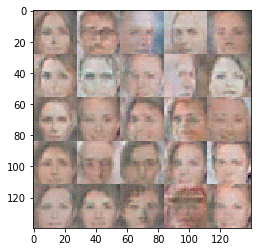

Epoch 1/5... Discriminator Loss: 1.2492... Generator Loss: 1.7482
Epoch 1/5... Discriminator Loss: 0.8606... Generator Loss: 1.6080
Epoch 1/5... Discriminator Loss: 1.0408... Generator Loss: 1.7642
Epoch 1/5... Discriminator Loss: 1.2599... Generator Loss: 1.4222
Epoch 1/5... Discriminator Loss: 0.9145... Generator Loss: 1.4858
Epoch 1/5... Discriminator Loss: 1.1677... Generator Loss: 1.7626
Epoch 1/5... Discriminator Loss: 0.8153... Generator Loss: 2.0101
Epoch 1/5... Discriminator Loss: 0.8653... Generator Loss: 1.6494
Epoch 1/5... Discriminator Loss: 1.2054... Generator Loss: 1.9666
Epoch 1/5... Discriminator Loss: 1.0370... Generator Loss: 1.7958


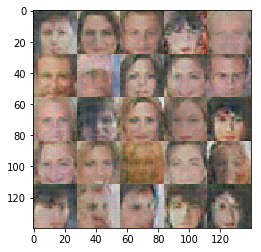

Epoch 1/5... Discriminator Loss: 0.5976... Generator Loss: 2.0551
Epoch 1/5... Discriminator Loss: 0.9493... Generator Loss: 1.3447
Epoch 1/5... Discriminator Loss: 0.9830... Generator Loss: 1.6775
Epoch 1/5... Discriminator Loss: 1.0015... Generator Loss: 1.7368
Epoch 1/5... Discriminator Loss: 0.7190... Generator Loss: 1.5602
Epoch 1/5... Discriminator Loss: 0.7099... Generator Loss: 1.5844
Epoch 1/5... Discriminator Loss: 1.1769... Generator Loss: 2.4244
Epoch 1/5... Discriminator Loss: 0.6658... Generator Loss: 2.6569
Epoch 1/5... Discriminator Loss: 0.8768... Generator Loss: 1.7279
Epoch 1/5... Discriminator Loss: 1.1143... Generator Loss: 1.7610


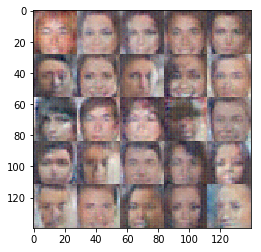

Epoch 1/5... Discriminator Loss: 1.4778... Generator Loss: 1.8892
Epoch 1/5... Discriminator Loss: 1.0654... Generator Loss: 1.7623
Epoch 1/5... Discriminator Loss: 1.0899... Generator Loss: 1.5849
Epoch 1/5... Discriminator Loss: 1.0129... Generator Loss: 1.5798
Epoch 1/5... Discriminator Loss: 0.8863... Generator Loss: 1.3693
Epoch 1/5... Discriminator Loss: 0.7127... Generator Loss: 2.1043
Epoch 1/5... Discriminator Loss: 1.2021... Generator Loss: 1.5134
Epoch 1/5... Discriminator Loss: 0.7468... Generator Loss: 2.0367
Epoch 1/5... Discriminator Loss: 0.7659... Generator Loss: 2.0569
Epoch 1/5... Discriminator Loss: 0.9519... Generator Loss: 1.4428


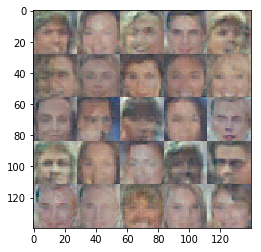

Epoch 1/5... Discriminator Loss: 1.0795... Generator Loss: 1.6859
Epoch 1/5... Discriminator Loss: 1.3995... Generator Loss: 1.0656
Epoch 1/5... Discriminator Loss: 0.9088... Generator Loss: 1.8798
Epoch 1/5... Discriminator Loss: 0.8026... Generator Loss: 2.1624
Epoch 1/5... Discriminator Loss: 0.8057... Generator Loss: 1.9012
Epoch 1/5... Discriminator Loss: 0.7198... Generator Loss: 1.4871
Epoch 1/5... Discriminator Loss: 1.4053... Generator Loss: 2.4143
Epoch 1/5... Discriminator Loss: 1.0589... Generator Loss: 2.0108
Epoch 1/5... Discriminator Loss: 0.8886... Generator Loss: 2.1767
Epoch 1/5... Discriminator Loss: 0.8936... Generator Loss: 1.8507


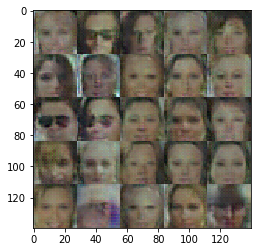

Epoch 1/5... Discriminator Loss: 0.7799... Generator Loss: 2.6152
Epoch 1/5... Discriminator Loss: 0.8582... Generator Loss: 1.8069
Epoch 1/5... Discriminator Loss: 0.8185... Generator Loss: 1.4184
Epoch 1/5... Discriminator Loss: 0.4462... Generator Loss: 1.8031
Epoch 1/5... Discriminator Loss: 1.2454... Generator Loss: 1.3306
Epoch 1/5... Discriminator Loss: 1.0722... Generator Loss: 1.8156
Epoch 1/5... Discriminator Loss: 0.9395... Generator Loss: 1.8264
Epoch 1/5... Discriminator Loss: 1.0374... Generator Loss: 1.7640
Epoch 1/5... Discriminator Loss: 0.7799... Generator Loss: 1.7004
Epoch 1/5... Discriminator Loss: 1.1899... Generator Loss: 1.5048


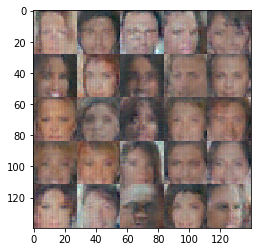

Epoch 1/5... Discriminator Loss: 0.8689... Generator Loss: 1.8441
Epoch 1/5... Discriminator Loss: 0.9930... Generator Loss: 1.2911
Epoch 1/5... Discriminator Loss: 1.1419... Generator Loss: 1.3853
Epoch 1/5... Discriminator Loss: 1.0870... Generator Loss: 1.5596
Epoch 1/5... Discriminator Loss: 0.7048... Generator Loss: 1.3084
Epoch 1/5... Discriminator Loss: 0.8580... Generator Loss: 2.5040
Epoch 1/5... Discriminator Loss: 0.6588... Generator Loss: 1.9385
Epoch 1/5... Discriminator Loss: 0.6142... Generator Loss: 1.8329
Epoch 1/5... Discriminator Loss: 0.6448... Generator Loss: 2.0146
Epoch 1/5... Discriminator Loss: 1.1707... Generator Loss: 1.8173


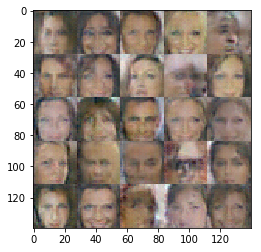

Epoch 1/5... Discriminator Loss: 0.8989... Generator Loss: 2.3328
Epoch 1/5... Discriminator Loss: 0.7926... Generator Loss: 1.9709
Epoch 1/5... Discriminator Loss: 1.2314... Generator Loss: 1.5807
Epoch 1/5... Discriminator Loss: 1.0706... Generator Loss: 1.9175
Epoch 1/5... Discriminator Loss: 1.0819... Generator Loss: 1.7981
Epoch 1/5... Discriminator Loss: 0.9778... Generator Loss: 1.4873
Epoch 1/5... Discriminator Loss: 0.9567... Generator Loss: 2.0503
Epoch 1/5... Discriminator Loss: 0.8731... Generator Loss: 1.8509
Epoch 1/5... Discriminator Loss: 0.6451... Generator Loss: 1.8427
Epoch 1/5... Discriminator Loss: 0.7420... Generator Loss: 1.7752


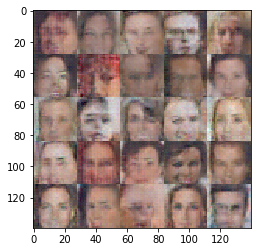

Epoch 1/5... Discriminator Loss: 0.8469... Generator Loss: 1.9585
Epoch 1/5... Discriminator Loss: 0.8376... Generator Loss: 1.3943
Epoch 1/5... Discriminator Loss: 1.0538... Generator Loss: 1.5001
Epoch 1/5... Discriminator Loss: 0.9569... Generator Loss: 1.8815
Epoch 1/5... Discriminator Loss: 0.5767... Generator Loss: 1.9293
Epoch 1/5... Discriminator Loss: 1.0001... Generator Loss: 1.6925
Epoch 1/5... Discriminator Loss: 0.9621... Generator Loss: 2.5004
Epoch 1/5... Discriminator Loss: 1.1518... Generator Loss: 1.8282
Epoch 1/5... Discriminator Loss: 0.7699... Generator Loss: 2.0701
Epoch 1/5... Discriminator Loss: 0.7626... Generator Loss: 2.2852


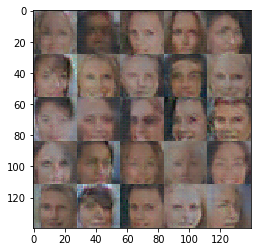

Epoch 1/5... Discriminator Loss: 0.5395... Generator Loss: 1.9462
Epoch 1/5... Discriminator Loss: 0.5087... Generator Loss: 2.3105
Epoch 1/5... Discriminator Loss: 0.9048... Generator Loss: 2.5780
Epoch 1/5... Discriminator Loss: 1.0646... Generator Loss: 2.7643
Epoch 1/5... Discriminator Loss: 0.7073... Generator Loss: 2.7072
Epoch 1/5... Discriminator Loss: 0.5412... Generator Loss: 1.6339
Epoch 1/5... Discriminator Loss: 0.4420... Generator Loss: 1.9521
Epoch 1/5... Discriminator Loss: 0.5462... Generator Loss: 1.7099
Epoch 1/5... Discriminator Loss: 1.0860... Generator Loss: 2.6281
Epoch 1/5... Discriminator Loss: 0.6361... Generator Loss: 1.9329


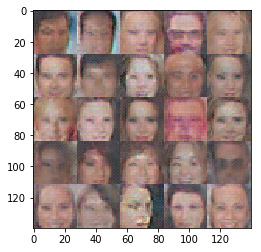

Epoch 1/5... Discriminator Loss: 1.2282... Generator Loss: 1.1500
Epoch 1/5... Discriminator Loss: 0.6205... Generator Loss: 2.3075
Epoch 1/5... Discriminator Loss: 0.5846... Generator Loss: 1.6010
Epoch 1/5... Discriminator Loss: 1.1949... Generator Loss: 2.1750
Epoch 1/5... Discriminator Loss: 0.5189... Generator Loss: 2.3276
Epoch 1/5... Discriminator Loss: 0.8597... Generator Loss: 2.5341
Epoch 2/5... Discriminator Loss: 0.8657... Generator Loss: 1.9521
Epoch 2/5... Discriminator Loss: 1.0350... Generator Loss: 1.8727
Epoch 2/5... Discriminator Loss: 0.8346... Generator Loss: 2.7126
Epoch 2/5... Discriminator Loss: 0.5589... Generator Loss: 1.8594


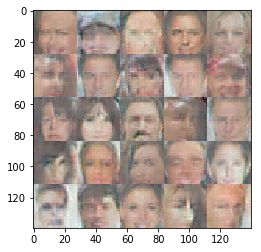

Epoch 2/5... Discriminator Loss: 0.7358... Generator Loss: 2.1222
Epoch 2/5... Discriminator Loss: 1.1513... Generator Loss: 1.3230
Epoch 2/5... Discriminator Loss: 1.0066... Generator Loss: 1.5680
Epoch 2/5... Discriminator Loss: 0.6981... Generator Loss: 2.0129
Epoch 2/5... Discriminator Loss: 1.1653... Generator Loss: 1.6506
Epoch 2/5... Discriminator Loss: 1.1086... Generator Loss: 1.3476
Epoch 2/5... Discriminator Loss: 1.0591... Generator Loss: 2.6868
Epoch 2/5... Discriminator Loss: 1.3396... Generator Loss: 1.8038
Epoch 2/5... Discriminator Loss: 0.8040... Generator Loss: 1.7154
Epoch 2/5... Discriminator Loss: 0.7738... Generator Loss: 1.8848


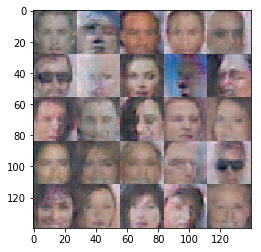

Epoch 2/5... Discriminator Loss: 0.5910... Generator Loss: 1.7440
Epoch 2/5... Discriminator Loss: 0.9795... Generator Loss: 1.8500
Epoch 2/5... Discriminator Loss: 0.8022... Generator Loss: 1.6815
Epoch 2/5... Discriminator Loss: 1.0463... Generator Loss: 1.5196
Epoch 2/5... Discriminator Loss: 0.9517... Generator Loss: 2.1098
Epoch 2/5... Discriminator Loss: 0.7407... Generator Loss: 1.4836
Epoch 2/5... Discriminator Loss: 0.9664... Generator Loss: 1.7827
Epoch 2/5... Discriminator Loss: 0.7231... Generator Loss: 1.7908
Epoch 2/5... Discriminator Loss: 0.8856... Generator Loss: 1.9342
Epoch 2/5... Discriminator Loss: 0.7381... Generator Loss: 1.7672


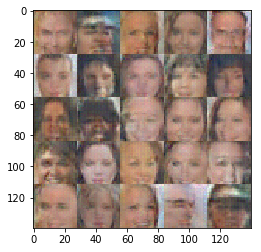

Epoch 2/5... Discriminator Loss: 1.1215... Generator Loss: 1.9084
Epoch 2/5... Discriminator Loss: 0.4669... Generator Loss: 2.3601
Epoch 2/5... Discriminator Loss: 1.0051... Generator Loss: 2.6458
Epoch 2/5... Discriminator Loss: 1.1412... Generator Loss: 2.0568
Epoch 2/5... Discriminator Loss: 0.9146... Generator Loss: 1.8198
Epoch 2/5... Discriminator Loss: 1.3099... Generator Loss: 1.9270
Epoch 2/5... Discriminator Loss: 0.8335... Generator Loss: 2.5654
Epoch 2/5... Discriminator Loss: 0.3551... Generator Loss: 2.2357
Epoch 2/5... Discriminator Loss: 0.6766... Generator Loss: 2.1972
Epoch 2/5... Discriminator Loss: 0.7200... Generator Loss: 2.6053


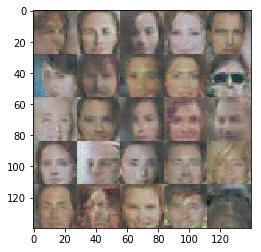

Epoch 2/5... Discriminator Loss: 1.0847... Generator Loss: 2.7210
Epoch 2/5... Discriminator Loss: 1.2083... Generator Loss: 1.5461
Epoch 2/5... Discriminator Loss: 1.2028... Generator Loss: 2.6938
Epoch 2/5... Discriminator Loss: 0.5812... Generator Loss: 2.0631
Epoch 2/5... Discriminator Loss: 0.6783... Generator Loss: 2.4444
Epoch 2/5... Discriminator Loss: 1.2602... Generator Loss: 3.1467
Epoch 2/5... Discriminator Loss: 0.9063... Generator Loss: 2.9701
Epoch 2/5... Discriminator Loss: 0.8921... Generator Loss: 2.2223
Epoch 2/5... Discriminator Loss: 0.9233... Generator Loss: 1.4595
Epoch 2/5... Discriminator Loss: 0.9033... Generator Loss: 2.3614


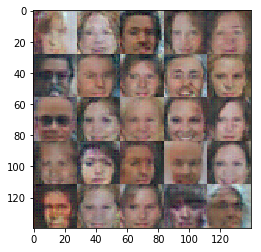

Epoch 2/5... Discriminator Loss: 0.6999... Generator Loss: 1.5185
Epoch 2/5... Discriminator Loss: 0.5614... Generator Loss: 1.6225
Epoch 2/5... Discriminator Loss: 0.7441... Generator Loss: 2.5867
Epoch 2/5... Discriminator Loss: 0.8366... Generator Loss: 2.6333
Epoch 2/5... Discriminator Loss: 0.5617... Generator Loss: 1.8072
Epoch 2/5... Discriminator Loss: 0.5189... Generator Loss: 1.9890
Epoch 2/5... Discriminator Loss: 0.6047... Generator Loss: 2.1833
Epoch 2/5... Discriminator Loss: 0.8953... Generator Loss: 2.2133
Epoch 2/5... Discriminator Loss: 0.7471... Generator Loss: 2.1592
Epoch 2/5... Discriminator Loss: 0.8596... Generator Loss: 1.9984


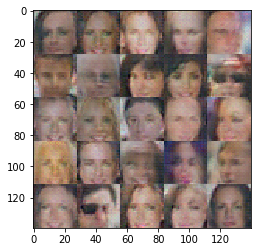

Epoch 2/5... Discriminator Loss: 0.6605... Generator Loss: 2.0851
Epoch 2/5... Discriminator Loss: 1.5605... Generator Loss: 2.3409
Epoch 2/5... Discriminator Loss: 0.4689... Generator Loss: 2.5368
Epoch 2/5... Discriminator Loss: 0.5874... Generator Loss: 2.1810
Epoch 2/5... Discriminator Loss: 1.4214... Generator Loss: 2.1293
Epoch 2/5... Discriminator Loss: 0.7028... Generator Loss: 2.0964
Epoch 2/5... Discriminator Loss: 0.9005... Generator Loss: 1.7923
Epoch 2/5... Discriminator Loss: 1.4988... Generator Loss: 1.8338
Epoch 2/5... Discriminator Loss: 0.6024... Generator Loss: 1.8668
Epoch 2/5... Discriminator Loss: 0.7870... Generator Loss: 1.8743


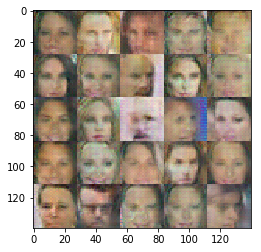

Epoch 2/5... Discriminator Loss: 0.8522... Generator Loss: 1.5315
Epoch 2/5... Discriminator Loss: 0.6692... Generator Loss: 2.4639
Epoch 2/5... Discriminator Loss: 0.7316... Generator Loss: 2.1021
Epoch 2/5... Discriminator Loss: 1.2452... Generator Loss: 1.6109
Epoch 2/5... Discriminator Loss: 0.5740... Generator Loss: 2.3930
Epoch 2/5... Discriminator Loss: 0.7551... Generator Loss: 2.2454
Epoch 2/5... Discriminator Loss: 0.8889... Generator Loss: 3.0152
Epoch 2/5... Discriminator Loss: 0.9775... Generator Loss: 1.9611
Epoch 2/5... Discriminator Loss: 0.8181... Generator Loss: 2.0756
Epoch 2/5... Discriminator Loss: 0.6722... Generator Loss: 2.2538


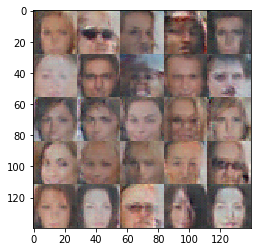

Epoch 2/5... Discriminator Loss: 0.7875... Generator Loss: 1.9445
Epoch 2/5... Discriminator Loss: 0.7845... Generator Loss: 2.3166
Epoch 2/5... Discriminator Loss: 0.8882... Generator Loss: 2.3795
Epoch 2/5... Discriminator Loss: 1.0010... Generator Loss: 2.5432
Epoch 2/5... Discriminator Loss: 0.9692... Generator Loss: 2.3029
Epoch 2/5... Discriminator Loss: 1.2923... Generator Loss: 2.7258
Epoch 2/5... Discriminator Loss: 0.4983... Generator Loss: 2.7803
Epoch 2/5... Discriminator Loss: 0.8918... Generator Loss: 2.0170
Epoch 2/5... Discriminator Loss: 0.4145... Generator Loss: 3.1451
Epoch 2/5... Discriminator Loss: 0.6411... Generator Loss: 2.1712


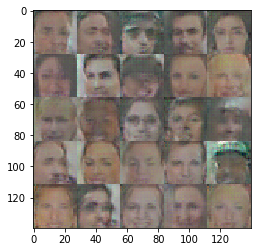

Epoch 2/5... Discriminator Loss: 0.7340... Generator Loss: 2.3881
Epoch 2/5... Discriminator Loss: 0.3487... Generator Loss: 2.1871
Epoch 2/5... Discriminator Loss: 0.8657... Generator Loss: 1.7696
Epoch 2/5... Discriminator Loss: 0.8812... Generator Loss: 1.5961
Epoch 2/5... Discriminator Loss: 0.3718... Generator Loss: 2.6431
Epoch 2/5... Discriminator Loss: 0.4472... Generator Loss: 2.2879
Epoch 2/5... Discriminator Loss: 0.3973... Generator Loss: 3.2148
Epoch 2/5... Discriminator Loss: 0.8657... Generator Loss: 2.3033
Epoch 2/5... Discriminator Loss: 0.6330... Generator Loss: 2.3683
Epoch 2/5... Discriminator Loss: 0.5110... Generator Loss: 3.6521


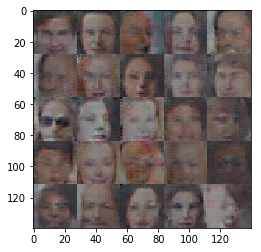

Epoch 2/5... Discriminator Loss: 0.7297... Generator Loss: 2.1660
Epoch 2/5... Discriminator Loss: 0.6284... Generator Loss: 3.4861
Epoch 2/5... Discriminator Loss: 0.5677... Generator Loss: 1.7257
Epoch 2/5... Discriminator Loss: 0.6649... Generator Loss: 2.5853
Epoch 2/5... Discriminator Loss: 0.3406... Generator Loss: 3.6357
Epoch 2/5... Discriminator Loss: 1.5117... Generator Loss: 1.2278
Epoch 2/5... Discriminator Loss: 0.3634... Generator Loss: 3.3586
Epoch 2/5... Discriminator Loss: 0.5567... Generator Loss: 3.0186
Epoch 2/5... Discriminator Loss: 0.4932... Generator Loss: 2.2233
Epoch 2/5... Discriminator Loss: 1.6541... Generator Loss: 5.5955


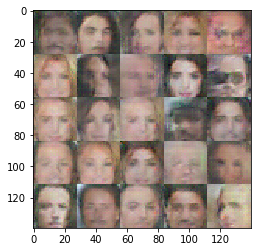

Epoch 2/5... Discriminator Loss: 0.4906... Generator Loss: 2.1619
Epoch 2/5... Discriminator Loss: 0.2525... Generator Loss: 2.7021
Epoch 2/5... Discriminator Loss: 0.9347... Generator Loss: 2.2085
Epoch 2/5... Discriminator Loss: 0.3328... Generator Loss: 1.6890
Epoch 2/5... Discriminator Loss: 0.9642... Generator Loss: 2.7003
Epoch 2/5... Discriminator Loss: 0.3668... Generator Loss: 3.7928
Epoch 2/5... Discriminator Loss: 0.3509... Generator Loss: 2.2031
Epoch 2/5... Discriminator Loss: 0.3566... Generator Loss: 2.5596
Epoch 2/5... Discriminator Loss: 0.9236... Generator Loss: 2.0504
Epoch 2/5... Discriminator Loss: 0.7308... Generator Loss: 1.9937


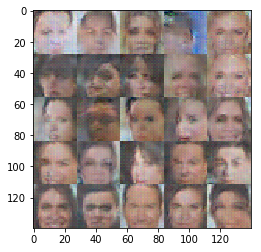

Epoch 2/5... Discriminator Loss: 0.7842... Generator Loss: 1.7068
Epoch 2/5... Discriminator Loss: 0.7675... Generator Loss: 1.9459
Epoch 2/5... Discriminator Loss: 1.2434... Generator Loss: 2.7048
Epoch 2/5... Discriminator Loss: 0.6429... Generator Loss: 2.3868
Epoch 2/5... Discriminator Loss: 1.0978... Generator Loss: 1.9073
Epoch 2/5... Discriminator Loss: 0.4616... Generator Loss: 2.9981
Epoch 2/5... Discriminator Loss: 0.8985... Generator Loss: 2.3219
Epoch 2/5... Discriminator Loss: 1.4814... Generator Loss: 1.7504
Epoch 2/5... Discriminator Loss: 0.7095... Generator Loss: 2.0370
Epoch 2/5... Discriminator Loss: 0.7416... Generator Loss: 2.2388


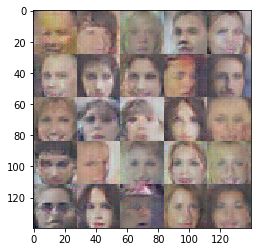

Epoch 2/5... Discriminator Loss: 0.4104... Generator Loss: 2.2062
Epoch 2/5... Discriminator Loss: 0.5609... Generator Loss: 2.4481
Epoch 2/5... Discriminator Loss: 0.3653... Generator Loss: 2.9060
Epoch 2/5... Discriminator Loss: 1.5164... Generator Loss: 3.1285
Epoch 2/5... Discriminator Loss: 0.4385... Generator Loss: 3.2852
Epoch 2/5... Discriminator Loss: 0.2620... Generator Loss: 3.0993
Epoch 2/5... Discriminator Loss: 0.2947... Generator Loss: 3.0689
Epoch 2/5... Discriminator Loss: 0.5445... Generator Loss: 2.7232
Epoch 2/5... Discriminator Loss: 0.6334... Generator Loss: 2.5546
Epoch 2/5... Discriminator Loss: 1.0727... Generator Loss: 2.2476


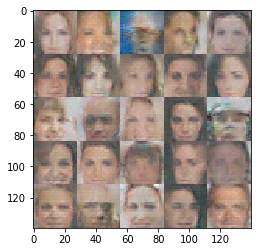

Epoch 2/5... Discriminator Loss: 0.4311... Generator Loss: 2.4215
Epoch 2/5... Discriminator Loss: 0.4525... Generator Loss: 2.2937
Epoch 2/5... Discriminator Loss: 0.7459... Generator Loss: 2.5727
Epoch 2/5... Discriminator Loss: 1.9042... Generator Loss: 2.7022
Epoch 2/5... Discriminator Loss: 0.7526... Generator Loss: 1.8774
Epoch 2/5... Discriminator Loss: 1.0749... Generator Loss: 2.4234
Epoch 2/5... Discriminator Loss: 0.8500... Generator Loss: 2.2650
Epoch 2/5... Discriminator Loss: 0.4871... Generator Loss: 1.8393
Epoch 2/5... Discriminator Loss: 0.5149... Generator Loss: 1.7318
Epoch 2/5... Discriminator Loss: 0.4671... Generator Loss: 2.2431


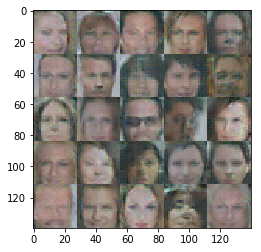

Epoch 2/5... Discriminator Loss: 0.3914... Generator Loss: 2.4594
Epoch 2/5... Discriminator Loss: 0.2549... Generator Loss: 2.6422
Epoch 2/5... Discriminator Loss: 0.5869... Generator Loss: 3.8685
Epoch 2/5... Discriminator Loss: 0.5490... Generator Loss: 1.7311
Epoch 2/5... Discriminator Loss: 0.6353... Generator Loss: 2.3157
Epoch 2/5... Discriminator Loss: 0.3214... Generator Loss: 2.8510
Epoch 2/5... Discriminator Loss: 0.5596... Generator Loss: 1.7371
Epoch 2/5... Discriminator Loss: 1.1604... Generator Loss: 3.5097
Epoch 2/5... Discriminator Loss: 0.6051... Generator Loss: 2.3580
Epoch 2/5... Discriminator Loss: 0.8186... Generator Loss: 2.0205


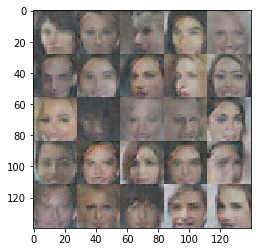

Epoch 2/5... Discriminator Loss: 0.3200... Generator Loss: 3.2289
Epoch 2/5... Discriminator Loss: 0.9485... Generator Loss: 1.9953
Epoch 2/5... Discriminator Loss: 1.0598... Generator Loss: 1.9518
Epoch 2/5... Discriminator Loss: 0.5739... Generator Loss: 2.5113
Epoch 2/5... Discriminator Loss: 0.8976... Generator Loss: 2.0699
Epoch 2/5... Discriminator Loss: 1.0698... Generator Loss: 2.2255
Epoch 2/5... Discriminator Loss: 0.7589... Generator Loss: 2.2414
Epoch 2/5... Discriminator Loss: 0.9370... Generator Loss: 3.1941
Epoch 2/5... Discriminator Loss: 0.5157... Generator Loss: 2.0728
Epoch 2/5... Discriminator Loss: 0.9829... Generator Loss: 3.3613


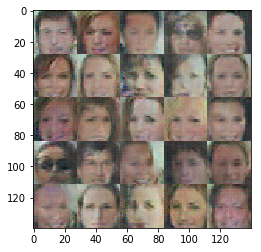

Epoch 2/5... Discriminator Loss: 0.5696... Generator Loss: 2.1212
Epoch 2/5... Discriminator Loss: 0.7059... Generator Loss: 4.2134
Epoch 2/5... Discriminator Loss: 0.9922... Generator Loss: 1.8385
Epoch 2/5... Discriminator Loss: 0.9309... Generator Loss: 1.5915
Epoch 2/5... Discriminator Loss: 0.8766... Generator Loss: 3.2642
Epoch 2/5... Discriminator Loss: 0.7637... Generator Loss: 1.9343
Epoch 2/5... Discriminator Loss: 0.8113... Generator Loss: 1.5901
Epoch 2/5... Discriminator Loss: 0.4588... Generator Loss: 1.9479
Epoch 2/5... Discriminator Loss: 0.9238... Generator Loss: 2.4686
Epoch 2/5... Discriminator Loss: 0.7957... Generator Loss: 2.3041


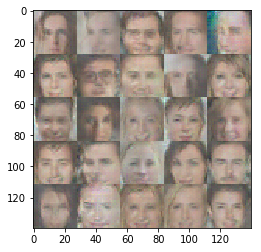

Epoch 2/5... Discriminator Loss: 0.5261... Generator Loss: 2.0770
Epoch 2/5... Discriminator Loss: 0.4424... Generator Loss: 2.4259
Epoch 2/5... Discriminator Loss: 0.2708... Generator Loss: 2.5108
Epoch 2/5... Discriminator Loss: 0.3799... Generator Loss: 2.7647
Epoch 2/5... Discriminator Loss: 1.1095... Generator Loss: 1.3700
Epoch 2/5... Discriminator Loss: 0.4852... Generator Loss: 2.9752
Epoch 2/5... Discriminator Loss: 0.5723... Generator Loss: 2.6346
Epoch 2/5... Discriminator Loss: 0.7067... Generator Loss: 4.0808
Epoch 2/5... Discriminator Loss: 0.5856... Generator Loss: 2.1111
Epoch 2/5... Discriminator Loss: 0.9622... Generator Loss: 2.1622


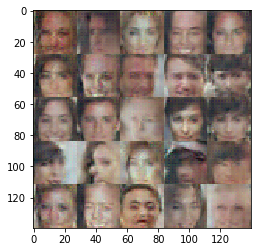

Epoch 2/5... Discriminator Loss: 0.6768... Generator Loss: 1.9455
Epoch 2/5... Discriminator Loss: 0.8514... Generator Loss: 1.6327
Epoch 2/5... Discriminator Loss: 0.6776... Generator Loss: 3.0387
Epoch 2/5... Discriminator Loss: 0.9730... Generator Loss: 2.3996
Epoch 2/5... Discriminator Loss: 0.8062... Generator Loss: 2.2334
Epoch 2/5... Discriminator Loss: 1.1378... Generator Loss: 1.6444
Epoch 2/5... Discriminator Loss: 0.4176... Generator Loss: 2.5951
Epoch 2/5... Discriminator Loss: 0.6156... Generator Loss: 2.8456
Epoch 2/5... Discriminator Loss: 0.5977... Generator Loss: 2.0202
Epoch 2/5... Discriminator Loss: 0.3562... Generator Loss: 3.0831


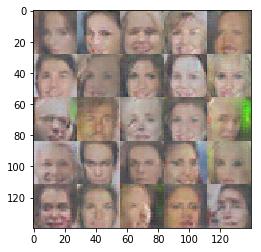

Epoch 2/5... Discriminator Loss: 0.3399... Generator Loss: 2.8647
Epoch 2/5... Discriminator Loss: 1.0545... Generator Loss: 3.8356
Epoch 2/5... Discriminator Loss: 1.2259... Generator Loss: 2.7336
Epoch 2/5... Discriminator Loss: 1.0592... Generator Loss: 2.5092
Epoch 2/5... Discriminator Loss: 0.8861... Generator Loss: 2.4856
Epoch 2/5... Discriminator Loss: 0.4676... Generator Loss: 3.0072
Epoch 2/5... Discriminator Loss: 0.9343... Generator Loss: 2.6412
Epoch 2/5... Discriminator Loss: 0.5482... Generator Loss: 3.2494
Epoch 2/5... Discriminator Loss: 0.5547... Generator Loss: 3.5814
Epoch 2/5... Discriminator Loss: 0.3767... Generator Loss: 2.3624


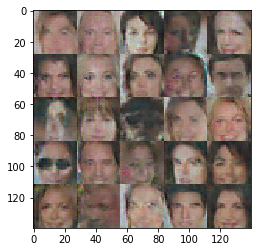

Epoch 2/5... Discriminator Loss: 1.3296... Generator Loss: 3.4290
Epoch 2/5... Discriminator Loss: 0.7107... Generator Loss: 2.4926
Epoch 2/5... Discriminator Loss: 0.5003... Generator Loss: 1.8908
Epoch 2/5... Discriminator Loss: 0.3531... Generator Loss: 2.8871
Epoch 2/5... Discriminator Loss: 0.3411... Generator Loss: 2.5668
Epoch 2/5... Discriminator Loss: 0.6832... Generator Loss: 2.8920
Epoch 2/5... Discriminator Loss: 0.2956... Generator Loss: 3.4581
Epoch 2/5... Discriminator Loss: 0.3834... Generator Loss: 3.6633
Epoch 2/5... Discriminator Loss: 0.6131... Generator Loss: 3.2605
Epoch 2/5... Discriminator Loss: 0.5971... Generator Loss: 2.8513


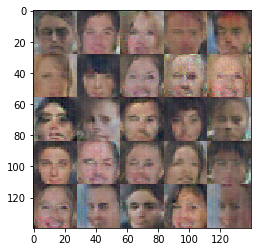

Epoch 2/5... Discriminator Loss: 0.5502... Generator Loss: 3.8573
Epoch 2/5... Discriminator Loss: 0.5162... Generator Loss: 3.0278
Epoch 2/5... Discriminator Loss: 0.5488... Generator Loss: 3.4651
Epoch 2/5... Discriminator Loss: 0.6577... Generator Loss: 3.9881
Epoch 2/5... Discriminator Loss: 0.2411... Generator Loss: 3.2517
Epoch 2/5... Discriminator Loss: 0.2113... Generator Loss: 2.4960
Epoch 2/5... Discriminator Loss: 1.1589... Generator Loss: 3.4656
Epoch 2/5... Discriminator Loss: 0.9991... Generator Loss: 2.1742
Epoch 2/5... Discriminator Loss: 0.6574... Generator Loss: 2.1470
Epoch 2/5... Discriminator Loss: 0.4339... Generator Loss: 2.8106


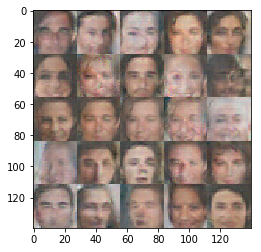

Epoch 2/5... Discriminator Loss: 0.4098... Generator Loss: 3.0963
Epoch 2/5... Discriminator Loss: 0.5495... Generator Loss: 4.0626
Epoch 2/5... Discriminator Loss: 0.7201... Generator Loss: 2.9138
Epoch 2/5... Discriminator Loss: 0.4911... Generator Loss: 2.8265
Epoch 2/5... Discriminator Loss: 0.7147... Generator Loss: 4.4655
Epoch 2/5... Discriminator Loss: 0.2542... Generator Loss: 2.7956
Epoch 2/5... Discriminator Loss: 0.5152... Generator Loss: 1.9997
Epoch 2/5... Discriminator Loss: 2.1128... Generator Loss: 5.9169
Epoch 2/5... Discriminator Loss: 0.9345... Generator Loss: 4.7642
Epoch 2/5... Discriminator Loss: 0.8834... Generator Loss: 2.5754


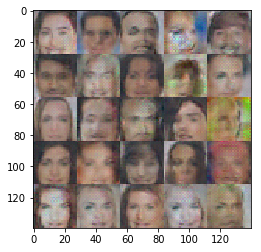

Epoch 2/5... Discriminator Loss: 0.2870... Generator Loss: 3.3428
Epoch 2/5... Discriminator Loss: 0.3590... Generator Loss: 3.3106
Epoch 2/5... Discriminator Loss: 0.3914... Generator Loss: 2.3285
Epoch 2/5... Discriminator Loss: 0.5435... Generator Loss: 2.9843
Epoch 2/5... Discriminator Loss: 0.2963... Generator Loss: 3.3749
Epoch 2/5... Discriminator Loss: 0.3086... Generator Loss: 3.8386
Epoch 2/5... Discriminator Loss: 0.1257... Generator Loss: 3.2462
Epoch 2/5... Discriminator Loss: 0.4763... Generator Loss: 2.1829
Epoch 2/5... Discriminator Loss: 0.8058... Generator Loss: 3.7906
Epoch 2/5... Discriminator Loss: 0.3408... Generator Loss: 2.6502


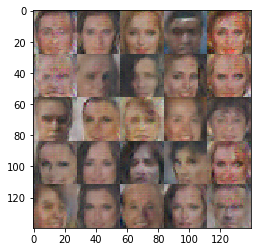

Epoch 2/5... Discriminator Loss: 0.8505... Generator Loss: 2.9360
Epoch 2/5... Discriminator Loss: 0.2349... Generator Loss: 4.5273
Epoch 2/5... Discriminator Loss: 1.1185... Generator Loss: 4.8442
Epoch 2/5... Discriminator Loss: 0.6624... Generator Loss: 2.3041
Epoch 2/5... Discriminator Loss: 0.4821... Generator Loss: 2.5756
Epoch 2/5... Discriminator Loss: 0.4461... Generator Loss: 3.1067
Epoch 2/5... Discriminator Loss: 1.2452... Generator Loss: 2.8676
Epoch 2/5... Discriminator Loss: 0.9371... Generator Loss: 1.9310
Epoch 2/5... Discriminator Loss: 0.3904... Generator Loss: 3.8719
Epoch 2/5... Discriminator Loss: 0.3966... Generator Loss: 3.2290


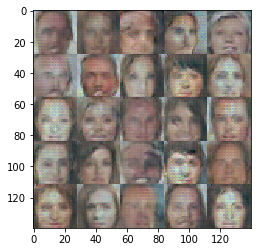

Epoch 2/5... Discriminator Loss: 0.7546... Generator Loss: 3.7950
Epoch 2/5... Discriminator Loss: 0.2826... Generator Loss: 3.0459
Epoch 2/5... Discriminator Loss: 0.8130... Generator Loss: 3.1767
Epoch 2/5... Discriminator Loss: 0.5064... Generator Loss: 3.6102
Epoch 2/5... Discriminator Loss: 0.5218... Generator Loss: 3.1395
Epoch 2/5... Discriminator Loss: 0.5454... Generator Loss: 2.9790
Epoch 2/5... Discriminator Loss: 0.4758... Generator Loss: 2.1751
Epoch 2/5... Discriminator Loss: 1.4252... Generator Loss: 1.4894
Epoch 2/5... Discriminator Loss: 0.5920... Generator Loss: 2.9546
Epoch 2/5... Discriminator Loss: 0.7867... Generator Loss: 3.0219


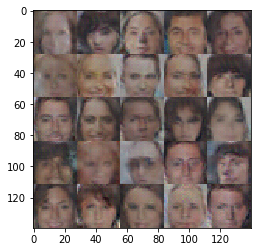

Epoch 2/5... Discriminator Loss: 0.3798... Generator Loss: 2.6352
Epoch 2/5... Discriminator Loss: 0.2324... Generator Loss: 3.2071
Epoch 2/5... Discriminator Loss: 1.0912... Generator Loss: 2.0470
Epoch 2/5... Discriminator Loss: 0.2665... Generator Loss: 3.4940
Epoch 2/5... Discriminator Loss: 1.0227... Generator Loss: 1.6507
Epoch 2/5... Discriminator Loss: 0.5495... Generator Loss: 2.6548
Epoch 2/5... Discriminator Loss: 0.8814... Generator Loss: 3.0486
Epoch 2/5... Discriminator Loss: 1.4762... Generator Loss: 2.3194
Epoch 2/5... Discriminator Loss: 0.5480... Generator Loss: 2.9142
Epoch 2/5... Discriminator Loss: 0.4363... Generator Loss: 2.3884


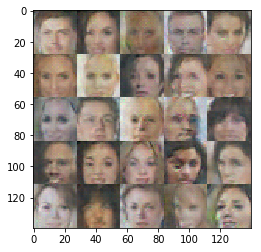

Epoch 2/5... Discriminator Loss: 0.7455... Generator Loss: 2.8403
Epoch 2/5... Discriminator Loss: 0.9923... Generator Loss: 3.8668
Epoch 2/5... Discriminator Loss: 0.3025... Generator Loss: 3.2761
Epoch 2/5... Discriminator Loss: 0.9456... Generator Loss: 4.1937
Epoch 2/5... Discriminator Loss: 1.0702... Generator Loss: 5.1313
Epoch 2/5... Discriminator Loss: 0.4922... Generator Loss: 3.0380
Epoch 2/5... Discriminator Loss: 0.8357... Generator Loss: 3.1223
Epoch 2/5... Discriminator Loss: 0.3215... Generator Loss: 5.2757
Epoch 2/5... Discriminator Loss: 0.7872... Generator Loss: 3.3008
Epoch 2/5... Discriminator Loss: 0.7666... Generator Loss: 4.1289


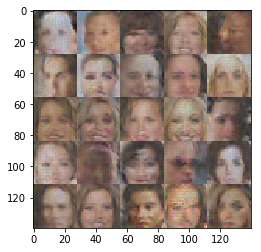

Epoch 2/5... Discriminator Loss: 0.3229... Generator Loss: 3.1277
Epoch 2/5... Discriminator Loss: 0.4730... Generator Loss: 2.6612
Epoch 2/5... Discriminator Loss: 0.6801... Generator Loss: 2.7519
Epoch 2/5... Discriminator Loss: 0.8593... Generator Loss: 3.4297
Epoch 2/5... Discriminator Loss: 0.6134... Generator Loss: 2.4950
Epoch 2/5... Discriminator Loss: 1.0459... Generator Loss: 3.9026
Epoch 2/5... Discriminator Loss: 0.7133... Generator Loss: 2.9528
Epoch 2/5... Discriminator Loss: 0.5918... Generator Loss: 3.3123
Epoch 2/5... Discriminator Loss: 0.6017... Generator Loss: 3.7159
Epoch 2/5... Discriminator Loss: 0.6315... Generator Loss: 3.8029


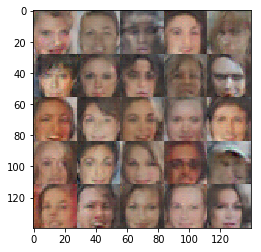

Epoch 2/5... Discriminator Loss: 0.3886... Generator Loss: 5.0615
Epoch 2/5... Discriminator Loss: 1.0452... Generator Loss: 2.0836
Epoch 2/5... Discriminator Loss: 0.7886... Generator Loss: 4.0100
Epoch 2/5... Discriminator Loss: 0.2792... Generator Loss: 4.1609
Epoch 2/5... Discriminator Loss: 0.5779... Generator Loss: 2.7437
Epoch 2/5... Discriminator Loss: 0.6066... Generator Loss: 2.9369
Epoch 2/5... Discriminator Loss: 0.3361... Generator Loss: 2.0486
Epoch 2/5... Discriminator Loss: 0.4716... Generator Loss: 2.3598
Epoch 2/5... Discriminator Loss: 0.4040... Generator Loss: 2.6489
Epoch 2/5... Discriminator Loss: 0.2554... Generator Loss: 2.6532


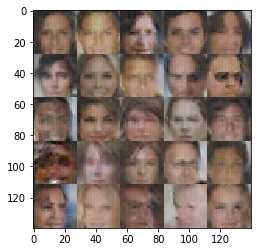

Epoch 2/5... Discriminator Loss: 0.8106... Generator Loss: 2.7125
Epoch 2/5... Discriminator Loss: 0.5744... Generator Loss: 3.0719
Epoch 2/5... Discriminator Loss: 1.2141... Generator Loss: 5.7939
Epoch 2/5... Discriminator Loss: 0.4343... Generator Loss: 3.0908
Epoch 2/5... Discriminator Loss: 1.1796... Generator Loss: 2.2330
Epoch 2/5... Discriminator Loss: 0.5356... Generator Loss: 2.5236
Epoch 2/5... Discriminator Loss: 1.5853... Generator Loss: 4.8776
Epoch 2/5... Discriminator Loss: 0.5422... Generator Loss: 2.8168
Epoch 2/5... Discriminator Loss: 0.6066... Generator Loss: 4.9859
Epoch 2/5... Discriminator Loss: 0.4218... Generator Loss: 2.8933


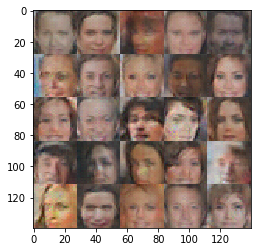

Epoch 2/5... Discriminator Loss: 0.6060... Generator Loss: 2.5271
Epoch 2/5... Discriminator Loss: 0.7549... Generator Loss: 3.2546
Epoch 2/5... Discriminator Loss: 0.3703... Generator Loss: 3.0237
Epoch 3/5... Discriminator Loss: 0.8318... Generator Loss: 3.5887
Epoch 3/5... Discriminator Loss: 0.5876... Generator Loss: 3.8678
Epoch 3/5... Discriminator Loss: 0.4537... Generator Loss: 3.3679
Epoch 3/5... Discriminator Loss: 0.6523... Generator Loss: 3.0063
Epoch 3/5... Discriminator Loss: 0.7431... Generator Loss: 2.0185
Epoch 3/5... Discriminator Loss: 0.4609... Generator Loss: 2.7960
Epoch 3/5... Discriminator Loss: 0.6525... Generator Loss: 3.4386


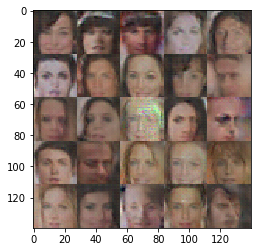

Epoch 3/5... Discriminator Loss: 0.2334... Generator Loss: 3.6009
Epoch 3/5... Discriminator Loss: 0.2938... Generator Loss: 3.4181
Epoch 3/5... Discriminator Loss: 0.4247... Generator Loss: 3.0172
Epoch 3/5... Discriminator Loss: 0.2998... Generator Loss: 2.0226
Epoch 3/5... Discriminator Loss: 0.4687... Generator Loss: 2.4109
Epoch 3/5... Discriminator Loss: 0.2566... Generator Loss: 3.7171
Epoch 3/5... Discriminator Loss: 0.7370... Generator Loss: 2.8489
Epoch 3/5... Discriminator Loss: 0.5004... Generator Loss: 2.1644
Epoch 3/5... Discriminator Loss: 0.7933... Generator Loss: 2.7310
Epoch 3/5... Discriminator Loss: 0.6233... Generator Loss: 4.0706


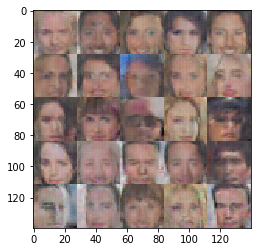

Epoch 3/5... Discriminator Loss: 0.5872... Generator Loss: 3.0774
Epoch 3/5... Discriminator Loss: 0.6391... Generator Loss: 4.2630
Epoch 3/5... Discriminator Loss: 1.0009... Generator Loss: 3.8139
Epoch 3/5... Discriminator Loss: 1.0218... Generator Loss: 3.2946
Epoch 3/5... Discriminator Loss: 0.8267... Generator Loss: 4.0677
Epoch 3/5... Discriminator Loss: 0.6362... Generator Loss: 2.1679
Epoch 3/5... Discriminator Loss: 0.9054... Generator Loss: 3.1088
Epoch 3/5... Discriminator Loss: 0.6390... Generator Loss: 1.9201
Epoch 3/5... Discriminator Loss: 0.6877... Generator Loss: 2.7381
Epoch 3/5... Discriminator Loss: 0.6384... Generator Loss: 2.3562


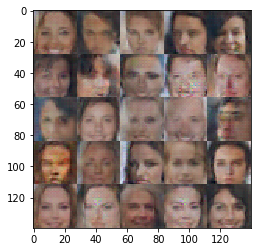

Epoch 3/5... Discriminator Loss: 0.6335... Generator Loss: 2.0342
Epoch 3/5... Discriminator Loss: 0.6724... Generator Loss: 2.7821
Epoch 3/5... Discriminator Loss: 0.9087... Generator Loss: 2.5085
Epoch 3/5... Discriminator Loss: 0.6338... Generator Loss: 2.2487
Epoch 3/5... Discriminator Loss: 0.7256... Generator Loss: 2.0442
Epoch 3/5... Discriminator Loss: 0.4134... Generator Loss: 2.7406
Epoch 3/5... Discriminator Loss: 0.5214... Generator Loss: 2.4348
Epoch 3/5... Discriminator Loss: 0.4611... Generator Loss: 2.5341
Epoch 3/5... Discriminator Loss: 0.5614... Generator Loss: 2.7944
Epoch 3/5... Discriminator Loss: 0.4201... Generator Loss: 2.5821


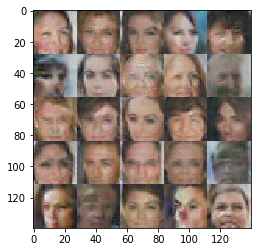

Epoch 3/5... Discriminator Loss: 0.6695... Generator Loss: 3.1749
Epoch 3/5... Discriminator Loss: 0.8674... Generator Loss: 2.3489
Epoch 3/5... Discriminator Loss: 0.3937... Generator Loss: 4.2305
Epoch 3/5... Discriminator Loss: 0.2826... Generator Loss: 4.4382
Epoch 3/5... Discriminator Loss: 0.3411... Generator Loss: 3.2549
Epoch 3/5... Discriminator Loss: 0.3692... Generator Loss: 4.1459
Epoch 3/5... Discriminator Loss: 0.4623... Generator Loss: 2.9227
Epoch 3/5... Discriminator Loss: 0.9627... Generator Loss: 2.2293
Epoch 3/5... Discriminator Loss: 0.4227... Generator Loss: 3.4991
Epoch 3/5... Discriminator Loss: 0.7036... Generator Loss: 5.5594


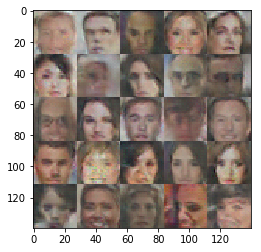

Epoch 3/5... Discriminator Loss: 0.8751... Generator Loss: 2.3080
Epoch 3/5... Discriminator Loss: 0.8439... Generator Loss: 2.9725
Epoch 3/5... Discriminator Loss: 0.7989... Generator Loss: 2.4147
Epoch 3/5... Discriminator Loss: 0.6080... Generator Loss: 2.7032
Epoch 3/5... Discriminator Loss: 0.5804... Generator Loss: 3.3849
Epoch 3/5... Discriminator Loss: 0.4624... Generator Loss: 2.9229
Epoch 3/5... Discriminator Loss: 0.8469... Generator Loss: 2.3609
Epoch 3/5... Discriminator Loss: 0.7464... Generator Loss: 4.4534
Epoch 3/5... Discriminator Loss: 0.5869... Generator Loss: 2.4592
Epoch 3/5... Discriminator Loss: 0.2728... Generator Loss: 2.9513


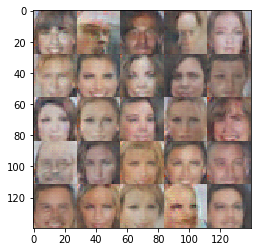

Epoch 3/5... Discriminator Loss: 0.6911... Generator Loss: 2.5281
Epoch 3/5... Discriminator Loss: 0.3567... Generator Loss: 3.0073
Epoch 3/5... Discriminator Loss: 0.5668... Generator Loss: 4.4467
Epoch 3/5... Discriminator Loss: 0.6920... Generator Loss: 2.8194
Epoch 3/5... Discriminator Loss: 0.2572... Generator Loss: 3.3021
Epoch 3/5... Discriminator Loss: 0.5899... Generator Loss: 2.1284
Epoch 3/5... Discriminator Loss: 0.2402... Generator Loss: 3.2009
Epoch 3/5... Discriminator Loss: 0.4632... Generator Loss: 3.1305
Epoch 3/5... Discriminator Loss: 0.4504... Generator Loss: 3.6157
Epoch 3/5... Discriminator Loss: 0.5830... Generator Loss: 4.5179


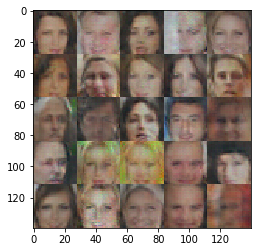

Epoch 3/5... Discriminator Loss: 1.0718... Generator Loss: 2.9398
Epoch 3/5... Discriminator Loss: 0.7093... Generator Loss: 2.8449
Epoch 3/5... Discriminator Loss: 0.7299... Generator Loss: 4.5704
Epoch 3/5... Discriminator Loss: 0.5097... Generator Loss: 4.1092
Epoch 3/5... Discriminator Loss: 0.6905... Generator Loss: 3.1614
Epoch 3/5... Discriminator Loss: 0.5222... Generator Loss: 3.9183
Epoch 3/5... Discriminator Loss: 0.6593... Generator Loss: 2.9151
Epoch 3/5... Discriminator Loss: 0.4679... Generator Loss: 4.3707
Epoch 3/5... Discriminator Loss: 0.6402... Generator Loss: 3.1644
Epoch 3/5... Discriminator Loss: 0.9616... Generator Loss: 4.1018


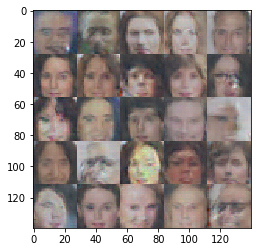

Epoch 3/5... Discriminator Loss: 0.2721... Generator Loss: 2.9930
Epoch 3/5... Discriminator Loss: 0.6036... Generator Loss: 2.2839
Epoch 3/5... Discriminator Loss: 0.4149... Generator Loss: 3.1430
Epoch 3/5... Discriminator Loss: 0.5161... Generator Loss: 2.5752
Epoch 3/5... Discriminator Loss: 0.6007... Generator Loss: 2.6058
Epoch 3/5... Discriminator Loss: 0.5812... Generator Loss: 3.1992
Epoch 3/5... Discriminator Loss: 0.5639... Generator Loss: 4.4110
Epoch 3/5... Discriminator Loss: 0.6102... Generator Loss: 3.1739
Epoch 3/5... Discriminator Loss: 0.6408... Generator Loss: 2.1582
Epoch 3/5... Discriminator Loss: 0.6246... Generator Loss: 3.4165


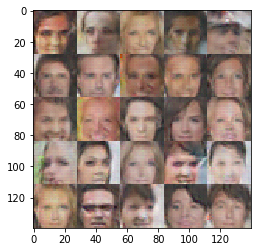

Epoch 3/5... Discriminator Loss: 0.5740... Generator Loss: 2.8833
Epoch 3/5... Discriminator Loss: 0.9346... Generator Loss: 5.5552
Epoch 3/5... Discriminator Loss: 0.5889... Generator Loss: 3.4361
Epoch 3/5... Discriminator Loss: 0.3208... Generator Loss: 3.9350
Epoch 3/5... Discriminator Loss: 0.3600... Generator Loss: 2.7857
Epoch 3/5... Discriminator Loss: 0.3091... Generator Loss: 2.5770
Epoch 3/5... Discriminator Loss: 0.5558... Generator Loss: 3.5042
Epoch 3/5... Discriminator Loss: 0.6120... Generator Loss: 3.2176
Epoch 3/5... Discriminator Loss: 0.5673... Generator Loss: 3.4989
Epoch 3/5... Discriminator Loss: 0.7519... Generator Loss: 4.1556


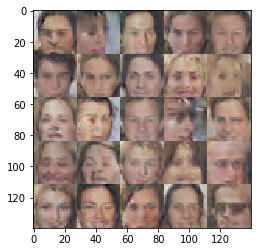

Epoch 3/5... Discriminator Loss: 0.7481... Generator Loss: 2.7334
Epoch 3/5... Discriminator Loss: 0.4498... Generator Loss: 2.8091
Epoch 3/5... Discriminator Loss: 0.2778... Generator Loss: 3.9548
Epoch 3/5... Discriminator Loss: 0.6874... Generator Loss: 3.5853
Epoch 3/5... Discriminator Loss: 0.3237... Generator Loss: 3.8025
Epoch 3/5... Discriminator Loss: 0.4573... Generator Loss: 2.8160
Epoch 3/5... Discriminator Loss: 0.2941... Generator Loss: 3.9122
Epoch 3/5... Discriminator Loss: 0.2333... Generator Loss: 4.1532
Epoch 3/5... Discriminator Loss: 0.4989... Generator Loss: 3.1859
Epoch 3/5... Discriminator Loss: 0.3817... Generator Loss: 3.6546


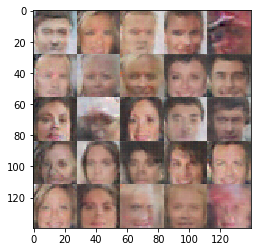

Epoch 3/5... Discriminator Loss: 0.2113... Generator Loss: 5.3060
Epoch 3/5... Discriminator Loss: 0.2894... Generator Loss: 3.9998
Epoch 3/5... Discriminator Loss: 0.3676... Generator Loss: 3.0937
Epoch 3/5... Discriminator Loss: 0.4858... Generator Loss: 3.4934
Epoch 3/5... Discriminator Loss: 0.3427... Generator Loss: 3.2056
Epoch 3/5... Discriminator Loss: 0.3445... Generator Loss: 2.9141
Epoch 3/5... Discriminator Loss: 0.3950... Generator Loss: 2.8797
Epoch 3/5... Discriminator Loss: 0.6746... Generator Loss: 2.4431
Epoch 3/5... Discriminator Loss: 0.8489... Generator Loss: 2.0936
Epoch 3/5... Discriminator Loss: 0.6839... Generator Loss: 3.0776


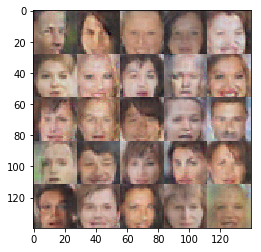

Epoch 3/5... Discriminator Loss: 0.5727... Generator Loss: 2.5569
Epoch 3/5... Discriminator Loss: 0.7886... Generator Loss: 2.1148
Epoch 3/5... Discriminator Loss: 0.7050... Generator Loss: 2.9372
Epoch 3/5... Discriminator Loss: 0.5601... Generator Loss: 2.8370
Epoch 3/5... Discriminator Loss: 0.6106... Generator Loss: 2.6961
Epoch 3/5... Discriminator Loss: 0.4545... Generator Loss: 3.2145
Epoch 3/5... Discriminator Loss: 0.2233... Generator Loss: 2.9673
Epoch 3/5... Discriminator Loss: 0.4164... Generator Loss: 4.0653
Epoch 3/5... Discriminator Loss: 0.7375... Generator Loss: 3.3058
Epoch 3/5... Discriminator Loss: 0.4290... Generator Loss: 3.2002


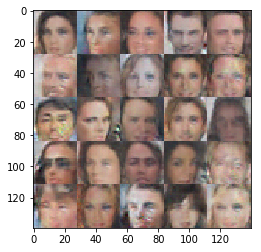

Epoch 3/5... Discriminator Loss: 0.3188... Generator Loss: 4.2539
Epoch 3/5... Discriminator Loss: 0.9807... Generator Loss: 3.9987
Epoch 3/5... Discriminator Loss: 1.0402... Generator Loss: 5.5143
Epoch 3/5... Discriminator Loss: 0.9931... Generator Loss: 4.5542
Epoch 3/5... Discriminator Loss: 0.3467... Generator Loss: 3.1352
Epoch 3/5... Discriminator Loss: 0.6523... Generator Loss: 3.6114
Epoch 3/5... Discriminator Loss: 0.2242... Generator Loss: 3.3497
Epoch 3/5... Discriminator Loss: 0.4539... Generator Loss: 3.7616
Epoch 3/5... Discriminator Loss: 0.8596... Generator Loss: 2.9312
Epoch 3/5... Discriminator Loss: 0.8371... Generator Loss: 4.6892


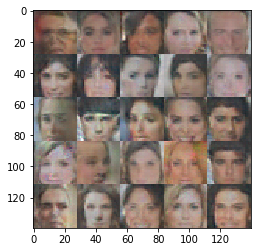

Epoch 3/5... Discriminator Loss: 0.3236... Generator Loss: 3.4543
Epoch 3/5... Discriminator Loss: 0.1911... Generator Loss: 3.7727
Epoch 3/5... Discriminator Loss: 0.9956... Generator Loss: 4.5032
Epoch 3/5... Discriminator Loss: 0.4197... Generator Loss: 4.4890
Epoch 3/5... Discriminator Loss: 0.5363... Generator Loss: 4.0389
Epoch 3/5... Discriminator Loss: 0.6648... Generator Loss: 3.6828
Epoch 3/5... Discriminator Loss: 0.2021... Generator Loss: 3.7288
Epoch 3/5... Discriminator Loss: 0.3075... Generator Loss: 3.2522
Epoch 3/5... Discriminator Loss: 0.7750... Generator Loss: 3.8448
Epoch 3/5... Discriminator Loss: 0.2669... Generator Loss: 4.2002


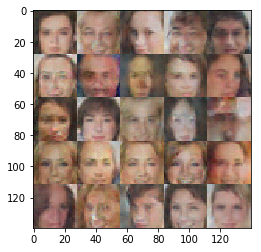

Epoch 3/5... Discriminator Loss: 0.3608... Generator Loss: 3.5148
Epoch 3/5... Discriminator Loss: 0.7708... Generator Loss: 4.4133
Epoch 3/5... Discriminator Loss: 0.3634... Generator Loss: 3.3775
Epoch 3/5... Discriminator Loss: 0.2788... Generator Loss: 3.0217
Epoch 3/5... Discriminator Loss: 0.5674... Generator Loss: 3.5533
Epoch 3/5... Discriminator Loss: 0.9079... Generator Loss: 4.2879
Epoch 3/5... Discriminator Loss: 0.4740... Generator Loss: 2.9291
Epoch 3/5... Discriminator Loss: 0.6952... Generator Loss: 4.7167
Epoch 3/5... Discriminator Loss: 0.3679... Generator Loss: 3.7674
Epoch 3/5... Discriminator Loss: 0.4214... Generator Loss: 3.1134


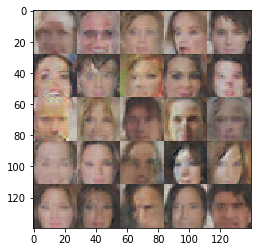

Epoch 3/5... Discriminator Loss: 0.3730... Generator Loss: 3.1796
Epoch 3/5... Discriminator Loss: 0.3893... Generator Loss: 2.7657
Epoch 3/5... Discriminator Loss: 0.5348... Generator Loss: 5.7936
Epoch 3/5... Discriminator Loss: 0.8425... Generator Loss: 4.9135
Epoch 3/5... Discriminator Loss: 0.3486... Generator Loss: 3.9510
Epoch 3/5... Discriminator Loss: 0.3374... Generator Loss: 4.3701
Epoch 3/5... Discriminator Loss: 0.4491... Generator Loss: 4.9125
Epoch 3/5... Discriminator Loss: 0.2523... Generator Loss: 2.9983
Epoch 3/5... Discriminator Loss: 0.3030... Generator Loss: 4.0108
Epoch 3/5... Discriminator Loss: 0.2107... Generator Loss: 4.3930


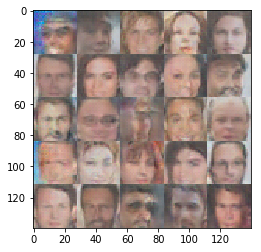

Epoch 3/5... Discriminator Loss: 0.2761... Generator Loss: 3.4375
Epoch 3/5... Discriminator Loss: 0.8642... Generator Loss: 4.4316
Epoch 3/5... Discriminator Loss: 0.2669... Generator Loss: 3.7185
Epoch 3/5... Discriminator Loss: 0.3616... Generator Loss: 2.8188
Epoch 3/5... Discriminator Loss: 0.6147... Generator Loss: 2.5226
Epoch 3/5... Discriminator Loss: 0.5109... Generator Loss: 3.2279
Epoch 3/5... Discriminator Loss: 0.7532... Generator Loss: 2.2035
Epoch 3/5... Discriminator Loss: 0.4934... Generator Loss: 3.5253
Epoch 3/5... Discriminator Loss: 0.5846... Generator Loss: 2.8244
Epoch 3/5... Discriminator Loss: 0.3326... Generator Loss: 3.2584


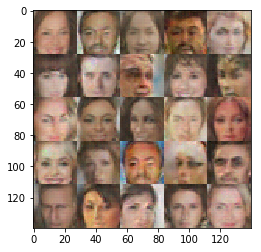

Epoch 3/5... Discriminator Loss: 0.7335... Generator Loss: 2.3081
Epoch 3/5... Discriminator Loss: 0.3495... Generator Loss: 3.9662
Epoch 3/5... Discriminator Loss: 0.5417... Generator Loss: 4.6082
Epoch 3/5... Discriminator Loss: 0.1791... Generator Loss: 3.7365
Epoch 3/5... Discriminator Loss: 0.3528... Generator Loss: 3.3460
Epoch 3/5... Discriminator Loss: 0.6086... Generator Loss: 2.5725
Epoch 3/5... Discriminator Loss: 0.5404... Generator Loss: 5.0543
Epoch 3/5... Discriminator Loss: 0.5426... Generator Loss: 3.3878
Epoch 3/5... Discriminator Loss: 0.4736... Generator Loss: 2.7620
Epoch 3/5... Discriminator Loss: 0.2511... Generator Loss: 3.1073


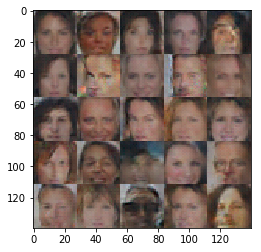

Epoch 3/5... Discriminator Loss: 0.8851... Generator Loss: 3.4941
Epoch 3/5... Discriminator Loss: 0.4388... Generator Loss: 2.6262
Epoch 3/5... Discriminator Loss: 0.4387... Generator Loss: 3.7815
Epoch 3/5... Discriminator Loss: 0.2538... Generator Loss: 3.4658
Epoch 3/5... Discriminator Loss: 0.6676... Generator Loss: 3.9752
Epoch 3/5... Discriminator Loss: 0.5124... Generator Loss: 2.3176
Epoch 3/5... Discriminator Loss: 1.0167... Generator Loss: 2.4748
Epoch 3/5... Discriminator Loss: 0.2731... Generator Loss: 2.6186
Epoch 3/5... Discriminator Loss: 0.4613... Generator Loss: 2.6741
Epoch 3/5... Discriminator Loss: 0.1897... Generator Loss: 3.4349


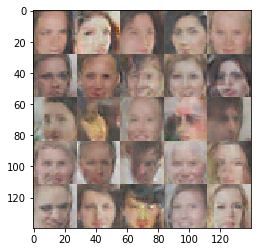

Epoch 3/5... Discriminator Loss: 0.3908... Generator Loss: 4.5188
Epoch 3/5... Discriminator Loss: 0.5346... Generator Loss: 3.1032
Epoch 3/5... Discriminator Loss: 0.3262... Generator Loss: 4.6266
Epoch 3/5... Discriminator Loss: 0.2419... Generator Loss: 3.9458
Epoch 3/5... Discriminator Loss: 0.7255... Generator Loss: 4.1695
Epoch 3/5... Discriminator Loss: 0.3716... Generator Loss: 4.0364
Epoch 3/5... Discriminator Loss: 0.5530... Generator Loss: 3.2629
Epoch 3/5... Discriminator Loss: 0.5297... Generator Loss: 2.2797
Epoch 3/5... Discriminator Loss: 0.4676... Generator Loss: 3.3888
Epoch 3/5... Discriminator Loss: 0.6473... Generator Loss: 2.5414


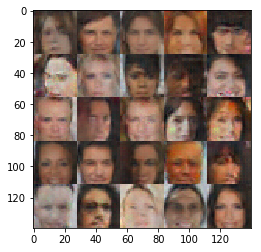

Epoch 3/5... Discriminator Loss: 0.2727... Generator Loss: 3.6423
Epoch 3/5... Discriminator Loss: 0.7570... Generator Loss: 5.3648
Epoch 3/5... Discriminator Loss: 0.2711... Generator Loss: 3.9062
Epoch 3/5... Discriminator Loss: 0.4071... Generator Loss: 2.9173
Epoch 3/5... Discriminator Loss: 0.9242... Generator Loss: 2.3237
Epoch 3/5... Discriminator Loss: 0.3070... Generator Loss: 3.5705
Epoch 3/5... Discriminator Loss: 0.2010... Generator Loss: 3.8249
Epoch 3/5... Discriminator Loss: 0.3614... Generator Loss: 3.7708
Epoch 3/5... Discriminator Loss: 0.4738... Generator Loss: 3.0731
Epoch 3/5... Discriminator Loss: 0.2891... Generator Loss: 3.9921


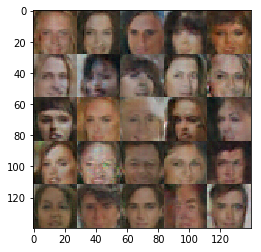

Epoch 3/5... Discriminator Loss: 0.4810... Generator Loss: 2.2193
Epoch 3/5... Discriminator Loss: 0.3025... Generator Loss: 3.1721
Epoch 3/5... Discriminator Loss: 0.3250... Generator Loss: 4.0648
Epoch 3/5... Discriminator Loss: 0.2730... Generator Loss: 4.3551
Epoch 3/5... Discriminator Loss: 0.3410... Generator Loss: 3.1212
Epoch 3/5... Discriminator Loss: 0.5575... Generator Loss: 3.5172
Epoch 3/5... Discriminator Loss: 0.6072... Generator Loss: 2.5086
Epoch 3/5... Discriminator Loss: 0.3882... Generator Loss: 4.3210
Epoch 3/5... Discriminator Loss: 0.4153... Generator Loss: 2.9993
Epoch 3/5... Discriminator Loss: 0.3807... Generator Loss: 3.3120


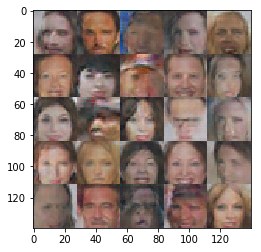

Epoch 3/5... Discriminator Loss: 1.2135... Generator Loss: 3.3178
Epoch 3/5... Discriminator Loss: 0.3371... Generator Loss: 4.0991
Epoch 3/5... Discriminator Loss: 0.4329... Generator Loss: 3.2952
Epoch 3/5... Discriminator Loss: 0.5284... Generator Loss: 2.7165
Epoch 3/5... Discriminator Loss: 0.7597... Generator Loss: 3.3260
Epoch 3/5... Discriminator Loss: 0.7289... Generator Loss: 2.9831
Epoch 3/5... Discriminator Loss: 0.5489... Generator Loss: 3.0845
Epoch 3/5... Discriminator Loss: 0.5124... Generator Loss: 2.6572
Epoch 3/5... Discriminator Loss: 0.1929... Generator Loss: 4.1253
Epoch 3/5... Discriminator Loss: 0.5902... Generator Loss: 3.9213


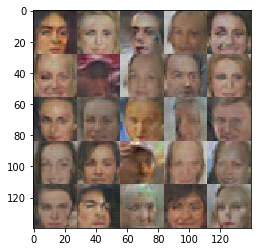

Epoch 3/5... Discriminator Loss: 0.2028... Generator Loss: 3.5756
Epoch 3/5... Discriminator Loss: 0.3157... Generator Loss: 4.2478
Epoch 3/5... Discriminator Loss: 0.6219... Generator Loss: 2.7630
Epoch 3/5... Discriminator Loss: 0.6645... Generator Loss: 2.8741
Epoch 3/5... Discriminator Loss: 0.2489... Generator Loss: 3.9647
Epoch 3/5... Discriminator Loss: 0.8571... Generator Loss: 3.3453
Epoch 3/5... Discriminator Loss: 0.6257... Generator Loss: 3.7816
Epoch 3/5... Discriminator Loss: 0.5333... Generator Loss: 5.6546
Epoch 3/5... Discriminator Loss: 0.4311... Generator Loss: 3.5980
Epoch 3/5... Discriminator Loss: 0.3380... Generator Loss: 3.3956


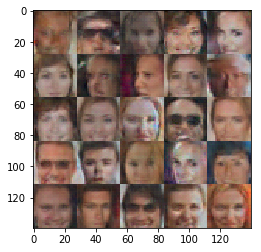

Epoch 3/5... Discriminator Loss: 0.4004... Generator Loss: 2.7023
Epoch 3/5... Discriminator Loss: 0.2119... Generator Loss: 4.2474
Epoch 3/5... Discriminator Loss: 0.8701... Generator Loss: 3.6123
Epoch 3/5... Discriminator Loss: 0.3784... Generator Loss: 2.8611
Epoch 3/5... Discriminator Loss: 0.2960... Generator Loss: 3.8857
Epoch 3/5... Discriminator Loss: 0.2105... Generator Loss: 3.9958
Epoch 3/5... Discriminator Loss: 0.3607... Generator Loss: 4.2169
Epoch 3/5... Discriminator Loss: 0.3509... Generator Loss: 3.7967
Epoch 3/5... Discriminator Loss: 0.4379... Generator Loss: 3.3637
Epoch 3/5... Discriminator Loss: 0.3947... Generator Loss: 3.3755


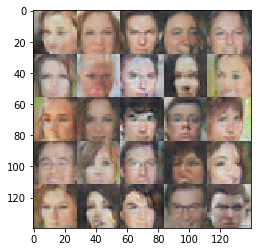

Epoch 3/5... Discriminator Loss: 0.3915... Generator Loss: 2.8693
Epoch 3/5... Discriminator Loss: 0.3216... Generator Loss: 3.8123
Epoch 3/5... Discriminator Loss: 0.2064... Generator Loss: 3.9597
Epoch 3/5... Discriminator Loss: 0.3347... Generator Loss: 4.0784
Epoch 3/5... Discriminator Loss: 0.4394... Generator Loss: 3.3029
Epoch 3/5... Discriminator Loss: 1.1182... Generator Loss: 8.1181
Epoch 3/5... Discriminator Loss: 0.5277... Generator Loss: 4.2413
Epoch 3/5... Discriminator Loss: 0.5397... Generator Loss: 4.6846
Epoch 3/5... Discriminator Loss: 0.2566... Generator Loss: 3.8722
Epoch 3/5... Discriminator Loss: 0.2264... Generator Loss: 3.8138


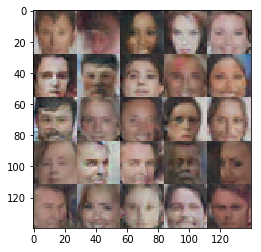

Epoch 3/5... Discriminator Loss: 0.6386... Generator Loss: 4.1355
Epoch 3/5... Discriminator Loss: 0.3229... Generator Loss: 3.6292
Epoch 3/5... Discriminator Loss: 1.3428... Generator Loss: 3.1818
Epoch 3/5... Discriminator Loss: 0.7310... Generator Loss: 3.3788
Epoch 3/5... Discriminator Loss: 0.6568... Generator Loss: 3.5009
Epoch 3/5... Discriminator Loss: 0.5584... Generator Loss: 2.6257
Epoch 3/5... Discriminator Loss: 0.4421... Generator Loss: 3.8038
Epoch 3/5... Discriminator Loss: 0.3433... Generator Loss: 3.2636
Epoch 3/5... Discriminator Loss: 0.5583... Generator Loss: 3.8994
Epoch 3/5... Discriminator Loss: 0.5492... Generator Loss: 3.3639


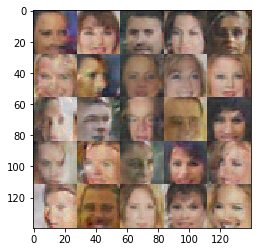

Epoch 3/5... Discriminator Loss: 0.2437... Generator Loss: 3.5273
Epoch 3/5... Discriminator Loss: 0.7454... Generator Loss: 4.3189
Epoch 3/5... Discriminator Loss: 0.4038... Generator Loss: 2.6204
Epoch 3/5... Discriminator Loss: 0.4006... Generator Loss: 3.1261
Epoch 3/5... Discriminator Loss: 0.4630... Generator Loss: 4.1133
Epoch 3/5... Discriminator Loss: 0.6326... Generator Loss: 3.4300
Epoch 3/5... Discriminator Loss: 0.5764... Generator Loss: 3.1705
Epoch 3/5... Discriminator Loss: 0.6117... Generator Loss: 4.5945
Epoch 3/5... Discriminator Loss: 0.1988... Generator Loss: 3.9692
Epoch 3/5... Discriminator Loss: 0.6080... Generator Loss: 4.0106


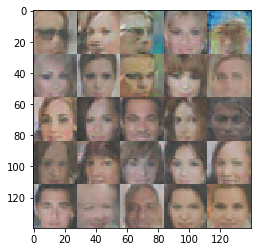

Epoch 3/5... Discriminator Loss: 0.3356... Generator Loss: 2.8467
Epoch 3/5... Discriminator Loss: 0.4556... Generator Loss: 3.0650
Epoch 3/5... Discriminator Loss: 0.3902... Generator Loss: 3.2714
Epoch 3/5... Discriminator Loss: 0.3978... Generator Loss: 3.8547
Epoch 3/5... Discriminator Loss: 0.2863... Generator Loss: 3.4999
Epoch 3/5... Discriminator Loss: 0.1805... Generator Loss: 4.7836
Epoch 3/5... Discriminator Loss: 1.0887... Generator Loss: 5.4654
Epoch 3/5... Discriminator Loss: 0.5957... Generator Loss: 3.4430
Epoch 3/5... Discriminator Loss: 0.3094... Generator Loss: 3.7344
Epoch 3/5... Discriminator Loss: 0.3548... Generator Loss: 3.4048


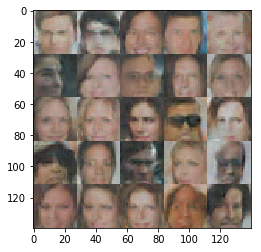

Epoch 3/5... Discriminator Loss: 0.3820... Generator Loss: 3.3690
Epoch 3/5... Discriminator Loss: 0.4415... Generator Loss: 3.9975
Epoch 3/5... Discriminator Loss: 0.3295... Generator Loss: 3.4382
Epoch 3/5... Discriminator Loss: 0.3597... Generator Loss: 3.7653
Epoch 3/5... Discriminator Loss: 0.5004... Generator Loss: 4.6508
Epoch 3/5... Discriminator Loss: 0.6150... Generator Loss: 4.4982
Epoch 3/5... Discriminator Loss: 0.1772... Generator Loss: 4.5378
Epoch 3/5... Discriminator Loss: 0.3123... Generator Loss: 3.5637
Epoch 3/5... Discriminator Loss: 0.3075... Generator Loss: 2.9987
Epoch 3/5... Discriminator Loss: 0.4083... Generator Loss: 3.9437


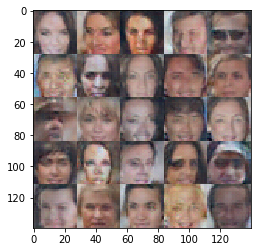

Epoch 3/5... Discriminator Loss: 0.0889... Generator Loss: 4.9368
Epoch 3/5... Discriminator Loss: 0.7644... Generator Loss: 5.4689
Epoch 3/5... Discriminator Loss: 0.2681... Generator Loss: 3.5402
Epoch 3/5... Discriminator Loss: 0.2833... Generator Loss: 4.2929
Epoch 3/5... Discriminator Loss: 0.3932... Generator Loss: 4.1316
Epoch 3/5... Discriminator Loss: 0.2424... Generator Loss: 4.6447
Epoch 3/5... Discriminator Loss: 0.6752... Generator Loss: 4.4465
Epoch 3/5... Discriminator Loss: 0.6865... Generator Loss: 4.7788
Epoch 3/5... Discriminator Loss: 0.1722... Generator Loss: 3.6890
Epoch 4/5... Discriminator Loss: 0.3597... Generator Loss: 4.4077


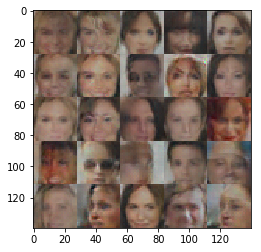

Epoch 4/5... Discriminator Loss: 0.7682... Generator Loss: 5.0825
Epoch 4/5... Discriminator Loss: 0.6454... Generator Loss: 3.2157
Epoch 4/5... Discriminator Loss: 0.5176... Generator Loss: 2.8317
Epoch 4/5... Discriminator Loss: 0.4834... Generator Loss: 2.7373
Epoch 4/5... Discriminator Loss: 0.3871... Generator Loss: 2.9184
Epoch 4/5... Discriminator Loss: 0.4847... Generator Loss: 4.1868
Epoch 4/5... Discriminator Loss: 0.3609... Generator Loss: 4.1273
Epoch 4/5... Discriminator Loss: 0.4561... Generator Loss: 4.3637
Epoch 4/5... Discriminator Loss: 0.5283... Generator Loss: 3.3795
Epoch 4/5... Discriminator Loss: 0.2216... Generator Loss: 3.8129


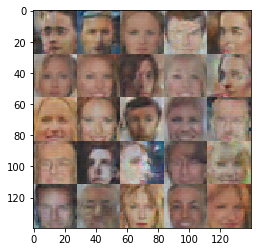

Epoch 4/5... Discriminator Loss: 0.6775... Generator Loss: 3.1903
Epoch 4/5... Discriminator Loss: 0.4567... Generator Loss: 4.7634
Epoch 4/5... Discriminator Loss: 0.5347... Generator Loss: 4.0243
Epoch 4/5... Discriminator Loss: 0.5576... Generator Loss: 2.9207
Epoch 4/5... Discriminator Loss: 0.4812... Generator Loss: 3.8120
Epoch 4/5... Discriminator Loss: 0.4164... Generator Loss: 4.0641
Epoch 4/5... Discriminator Loss: 0.3257... Generator Loss: 4.1778
Epoch 4/5... Discriminator Loss: 0.2054... Generator Loss: 4.4077
Epoch 4/5... Discriminator Loss: 0.7214... Generator Loss: 5.2830
Epoch 4/5... Discriminator Loss: 0.1698... Generator Loss: 4.1459


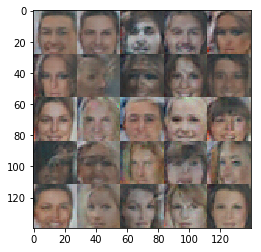

Epoch 4/5... Discriminator Loss: 0.2661... Generator Loss: 4.9178
Epoch 4/5... Discriminator Loss: 0.4175... Generator Loss: 3.5038
Epoch 4/5... Discriminator Loss: 0.2763... Generator Loss: 3.5249
Epoch 4/5... Discriminator Loss: 0.4244... Generator Loss: 4.2731
Epoch 4/5... Discriminator Loss: 0.2387... Generator Loss: 4.0435
Epoch 4/5... Discriminator Loss: 0.1987... Generator Loss: 3.4428
Epoch 4/5... Discriminator Loss: 0.5240... Generator Loss: 3.7120
Epoch 4/5... Discriminator Loss: 0.2835... Generator Loss: 5.0304
Epoch 4/5... Discriminator Loss: 0.7086... Generator Loss: 3.8593
Epoch 4/5... Discriminator Loss: 0.3766... Generator Loss: 2.8025


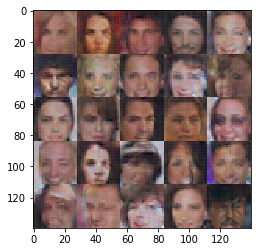

Epoch 4/5... Discriminator Loss: 0.2482... Generator Loss: 3.6138
Epoch 4/5... Discriminator Loss: 0.1982... Generator Loss: 4.0107
Epoch 4/5... Discriminator Loss: 0.1632... Generator Loss: 5.1619
Epoch 4/5... Discriminator Loss: 0.4945... Generator Loss: 4.7735
Epoch 4/5... Discriminator Loss: 0.5839... Generator Loss: 4.0915
Epoch 4/5... Discriminator Loss: 0.2302... Generator Loss: 4.2863
Epoch 4/5... Discriminator Loss: 0.3148... Generator Loss: 3.7030
Epoch 4/5... Discriminator Loss: 0.7757... Generator Loss: 6.0681
Epoch 4/5... Discriminator Loss: 0.4412... Generator Loss: 4.1498
Epoch 4/5... Discriminator Loss: 0.3250... Generator Loss: 3.9943


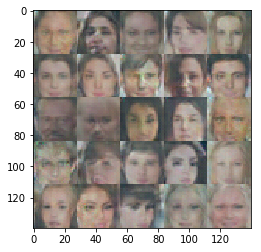

Epoch 4/5... Discriminator Loss: 0.4270... Generator Loss: 5.4040
Epoch 4/5... Discriminator Loss: 0.1719... Generator Loss: 3.2902
Epoch 4/5... Discriminator Loss: 0.4719... Generator Loss: 2.8676
Epoch 4/5... Discriminator Loss: 0.4829... Generator Loss: 3.4327
Epoch 4/5... Discriminator Loss: 0.4224... Generator Loss: 3.1346
Epoch 4/5... Discriminator Loss: 0.5208... Generator Loss: 5.1718
Epoch 4/5... Discriminator Loss: 0.7923... Generator Loss: 4.4980
Epoch 4/5... Discriminator Loss: 0.3158... Generator Loss: 3.0207
Epoch 4/5... Discriminator Loss: 0.3831... Generator Loss: 3.9048
Epoch 4/5... Discriminator Loss: 0.3563... Generator Loss: 2.8434


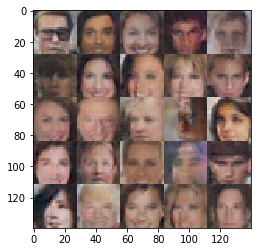

Epoch 4/5... Discriminator Loss: 0.4028... Generator Loss: 3.3337
Epoch 4/5... Discriminator Loss: 0.3154... Generator Loss: 3.1979
Epoch 4/5... Discriminator Loss: 0.8802... Generator Loss: 5.4049
Epoch 4/5... Discriminator Loss: 0.3240... Generator Loss: 4.2048
Epoch 4/5... Discriminator Loss: 0.5704... Generator Loss: 2.9146
Epoch 4/5... Discriminator Loss: 0.1926... Generator Loss: 4.1589
Epoch 4/5... Discriminator Loss: 0.2200... Generator Loss: 4.1370
Epoch 4/5... Discriminator Loss: 0.2218... Generator Loss: 4.1962
Epoch 4/5... Discriminator Loss: 0.2576... Generator Loss: 3.5672
Epoch 4/5... Discriminator Loss: 0.1997... Generator Loss: 4.7576


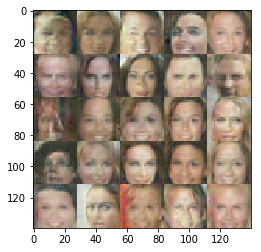

Epoch 4/5... Discriminator Loss: 0.8867... Generator Loss: 2.5716
Epoch 4/5... Discriminator Loss: 0.2948... Generator Loss: 4.7505
Epoch 4/5... Discriminator Loss: 0.1850... Generator Loss: 4.0882
Epoch 4/5... Discriminator Loss: 0.4838... Generator Loss: 3.9458
Epoch 4/5... Discriminator Loss: 0.7996... Generator Loss: 5.5369
Epoch 4/5... Discriminator Loss: 0.4337... Generator Loss: 4.2442
Epoch 4/5... Discriminator Loss: 0.3467... Generator Loss: 3.7410
Epoch 4/5... Discriminator Loss: 0.0902... Generator Loss: 4.1348
Epoch 4/5... Discriminator Loss: 0.3190... Generator Loss: 3.5761
Epoch 4/5... Discriminator Loss: 0.4526... Generator Loss: 2.7835


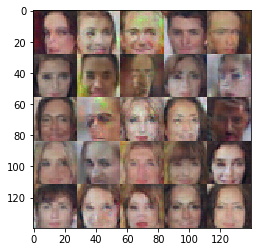

Epoch 4/5... Discriminator Loss: 0.3373... Generator Loss: 4.1498
Epoch 4/5... Discriminator Loss: 0.3274... Generator Loss: 4.7419
Epoch 4/5... Discriminator Loss: 0.2758... Generator Loss: 3.6864
Epoch 4/5... Discriminator Loss: 0.2581... Generator Loss: 5.0001
Epoch 4/5... Discriminator Loss: 0.5946... Generator Loss: 4.2551
Epoch 4/5... Discriminator Loss: 0.2594... Generator Loss: 4.4706
Epoch 4/5... Discriminator Loss: 0.5805... Generator Loss: 2.3375
Epoch 4/5... Discriminator Loss: 0.2569... Generator Loss: 3.5938
Epoch 4/5... Discriminator Loss: 0.3976... Generator Loss: 3.0671
Epoch 4/5... Discriminator Loss: 0.6806... Generator Loss: 3.4310


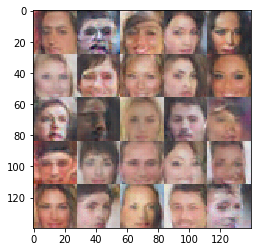

Epoch 4/5... Discriminator Loss: 0.3438... Generator Loss: 3.3466
Epoch 4/5... Discriminator Loss: 0.6189... Generator Loss: 3.0650
Epoch 4/5... Discriminator Loss: 0.3011... Generator Loss: 3.9378
Epoch 4/5... Discriminator Loss: 0.6102... Generator Loss: 3.2724
Epoch 4/5... Discriminator Loss: 0.6545... Generator Loss: 7.1279
Epoch 4/5... Discriminator Loss: 0.2507... Generator Loss: 4.4253
Epoch 4/5... Discriminator Loss: 0.4855... Generator Loss: 4.2769
Epoch 4/5... Discriminator Loss: 0.2776... Generator Loss: 4.6115
Epoch 4/5... Discriminator Loss: 0.2614... Generator Loss: 3.8995
Epoch 4/5... Discriminator Loss: 0.5190... Generator Loss: 4.3934


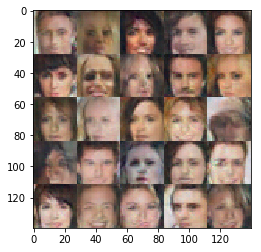

Epoch 4/5... Discriminator Loss: 0.2428... Generator Loss: 4.5515
Epoch 4/5... Discriminator Loss: 1.1288... Generator Loss: 3.9567
Epoch 4/5... Discriminator Loss: 0.1561... Generator Loss: 4.2967
Epoch 4/5... Discriminator Loss: 0.3634... Generator Loss: 3.3911
Epoch 4/5... Discriminator Loss: 0.4791... Generator Loss: 2.2144
Epoch 4/5... Discriminator Loss: 0.4149... Generator Loss: 3.5921
Epoch 4/5... Discriminator Loss: 0.4845... Generator Loss: 2.9862
Epoch 4/5... Discriminator Loss: 0.3022... Generator Loss: 2.5348
Epoch 4/5... Discriminator Loss: 0.3293... Generator Loss: 5.4417
Epoch 4/5... Discriminator Loss: 0.9301... Generator Loss: 5.9789


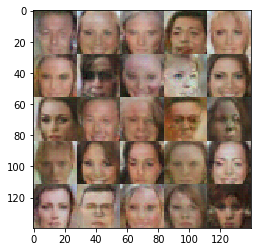

Epoch 4/5... Discriminator Loss: 0.1985... Generator Loss: 4.8862
Epoch 4/5... Discriminator Loss: 0.7127... Generator Loss: 2.8501
Epoch 4/5... Discriminator Loss: 0.5875... Generator Loss: 3.3898
Epoch 4/5... Discriminator Loss: 0.3605... Generator Loss: 3.9496
Epoch 4/5... Discriminator Loss: 0.5261... Generator Loss: 4.6305
Epoch 4/5... Discriminator Loss: 0.8361... Generator Loss: 5.3811
Epoch 4/5... Discriminator Loss: 1.0735... Generator Loss: 2.5625
Epoch 4/5... Discriminator Loss: 0.7006... Generator Loss: 3.8513
Epoch 4/5... Discriminator Loss: 1.0687... Generator Loss: 3.4099
Epoch 4/5... Discriminator Loss: 0.5154... Generator Loss: 3.3381


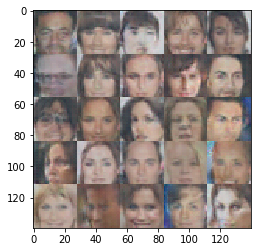

Epoch 4/5... Discriminator Loss: 1.0337... Generator Loss: 4.7040
Epoch 4/5... Discriminator Loss: 0.4039... Generator Loss: 2.7592
Epoch 4/5... Discriminator Loss: 0.5659... Generator Loss: 3.6276
Epoch 4/5... Discriminator Loss: 0.2579... Generator Loss: 4.5405
Epoch 4/5... Discriminator Loss: 0.3577... Generator Loss: 2.9971
Epoch 4/5... Discriminator Loss: 0.2918... Generator Loss: 4.2818
Epoch 4/5... Discriminator Loss: 0.5267... Generator Loss: 3.9042
Epoch 4/5... Discriminator Loss: 0.4899... Generator Loss: 3.2995
Epoch 4/5... Discriminator Loss: 0.3575... Generator Loss: 4.1751
Epoch 4/5... Discriminator Loss: 0.4155... Generator Loss: 3.6798


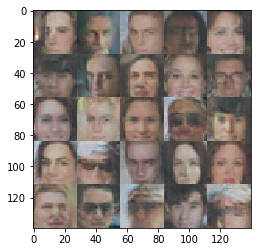

Epoch 4/5... Discriminator Loss: 0.2548... Generator Loss: 3.9481
Epoch 4/5... Discriminator Loss: 0.4873... Generator Loss: 4.4544
Epoch 4/5... Discriminator Loss: 0.4014... Generator Loss: 3.0505
Epoch 4/5... Discriminator Loss: 0.3481... Generator Loss: 3.4071
Epoch 4/5... Discriminator Loss: 0.4859... Generator Loss: 3.4217
Epoch 4/5... Discriminator Loss: 0.8766... Generator Loss: 4.5601
Epoch 4/5... Discriminator Loss: 0.5004... Generator Loss: 4.6372
Epoch 4/5... Discriminator Loss: 0.2035... Generator Loss: 3.2835
Epoch 4/5... Discriminator Loss: 0.2312... Generator Loss: 3.6249
Epoch 4/5... Discriminator Loss: 0.4359... Generator Loss: 3.2709


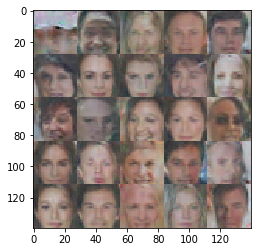

Epoch 4/5... Discriminator Loss: 0.1955... Generator Loss: 3.3530
Epoch 4/5... Discriminator Loss: 0.2133... Generator Loss: 3.7073
Epoch 4/5... Discriminator Loss: 0.1161... Generator Loss: 4.5366
Epoch 4/5... Discriminator Loss: 0.1778... Generator Loss: 4.9202
Epoch 4/5... Discriminator Loss: 0.6021... Generator Loss: 4.0499
Epoch 4/5... Discriminator Loss: 0.1382... Generator Loss: 4.3556
Epoch 4/5... Discriminator Loss: 0.2395... Generator Loss: 3.5482
Epoch 4/5... Discriminator Loss: 0.4198... Generator Loss: 3.7160
Epoch 4/5... Discriminator Loss: 0.5040... Generator Loss: 2.5623
Epoch 4/5... Discriminator Loss: 0.5777... Generator Loss: 3.2642


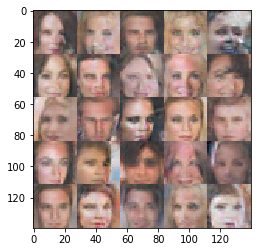

Epoch 4/5... Discriminator Loss: 0.2420... Generator Loss: 3.3333
Epoch 4/5... Discriminator Loss: 0.5565... Generator Loss: 3.0852
Epoch 4/5... Discriminator Loss: 0.2552... Generator Loss: 3.5152
Epoch 4/5... Discriminator Loss: 0.8780... Generator Loss: 3.2199
Epoch 4/5... Discriminator Loss: 0.1925... Generator Loss: 3.3931
Epoch 4/5... Discriminator Loss: 0.1481... Generator Loss: 3.9488
Epoch 4/5... Discriminator Loss: 0.6414... Generator Loss: 3.5080
Epoch 4/5... Discriminator Loss: 0.4619... Generator Loss: 4.5212
Epoch 4/5... Discriminator Loss: 0.2975... Generator Loss: 4.0935
Epoch 4/5... Discriminator Loss: 0.4912... Generator Loss: 4.8524


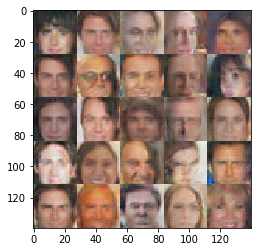

Epoch 4/5... Discriminator Loss: 0.6137... Generator Loss: 3.2341
Epoch 4/5... Discriminator Loss: 0.1954... Generator Loss: 3.9391
Epoch 4/5... Discriminator Loss: 0.1208... Generator Loss: 4.4830
Epoch 4/5... Discriminator Loss: 0.3694... Generator Loss: 2.8692
Epoch 4/5... Discriminator Loss: 0.2872... Generator Loss: 4.7623
Epoch 4/5... Discriminator Loss: 0.4226... Generator Loss: 4.9313
Epoch 4/5... Discriminator Loss: 0.3029... Generator Loss: 4.3963
Epoch 4/5... Discriminator Loss: 0.3535... Generator Loss: 4.1519
Epoch 4/5... Discriminator Loss: 0.3927... Generator Loss: 3.3361
Epoch 4/5... Discriminator Loss: 0.3077... Generator Loss: 4.2103


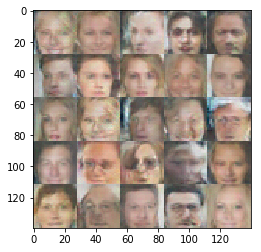

Epoch 4/5... Discriminator Loss: 0.1772... Generator Loss: 4.9795
Epoch 4/5... Discriminator Loss: 0.6901... Generator Loss: 2.8050
Epoch 4/5... Discriminator Loss: 0.2386... Generator Loss: 5.0776
Epoch 4/5... Discriminator Loss: 0.7874... Generator Loss: 3.4332
Epoch 4/5... Discriminator Loss: 1.2442... Generator Loss: 4.2262
Epoch 4/5... Discriminator Loss: 0.4998... Generator Loss: 3.4202
Epoch 4/5... Discriminator Loss: 0.6907... Generator Loss: 2.6069
Epoch 4/5... Discriminator Loss: 0.2853... Generator Loss: 3.2064
Epoch 4/5... Discriminator Loss: 0.2466... Generator Loss: 3.7154
Epoch 4/5... Discriminator Loss: 0.5634... Generator Loss: 5.0455


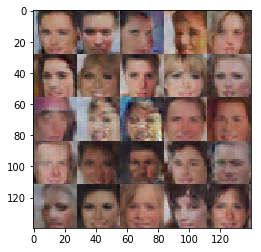

Epoch 4/5... Discriminator Loss: 0.1858... Generator Loss: 3.7261
Epoch 4/5... Discriminator Loss: 0.4401... Generator Loss: 2.8506
Epoch 4/5... Discriminator Loss: 0.2760... Generator Loss: 3.6410
Epoch 4/5... Discriminator Loss: 1.3500... Generator Loss: 4.3232
Epoch 4/5... Discriminator Loss: 0.3082... Generator Loss: 3.3455
Epoch 4/5... Discriminator Loss: 0.6105... Generator Loss: 3.1177
Epoch 4/5... Discriminator Loss: 0.2831... Generator Loss: 3.7235
Epoch 4/5... Discriminator Loss: 0.2566... Generator Loss: 3.7958
Epoch 4/5... Discriminator Loss: 0.1941... Generator Loss: 3.2920
Epoch 4/5... Discriminator Loss: 0.3087... Generator Loss: 4.1997


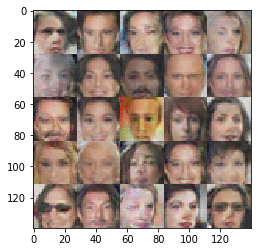

Epoch 4/5... Discriminator Loss: 0.4760... Generator Loss: 3.3399
Epoch 4/5... Discriminator Loss: 0.3456... Generator Loss: 4.0710
Epoch 4/5... Discriminator Loss: 0.3632... Generator Loss: 4.4896
Epoch 4/5... Discriminator Loss: 0.3136... Generator Loss: 3.9345
Epoch 4/5... Discriminator Loss: 0.4392... Generator Loss: 3.8847
Epoch 4/5... Discriminator Loss: 0.3130... Generator Loss: 3.5764
Epoch 4/5... Discriminator Loss: 0.2732... Generator Loss: 4.0615
Epoch 4/5... Discriminator Loss: 0.6158... Generator Loss: 4.9796
Epoch 4/5... Discriminator Loss: 0.5756... Generator Loss: 4.5688
Epoch 4/5... Discriminator Loss: 0.1932... Generator Loss: 4.2516


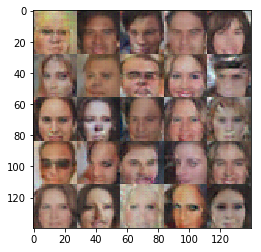

Epoch 4/5... Discriminator Loss: 0.1591... Generator Loss: 4.7713
Epoch 4/5... Discriminator Loss: 0.4234... Generator Loss: 4.3483
Epoch 4/5... Discriminator Loss: 0.2351... Generator Loss: 4.2920
Epoch 4/5... Discriminator Loss: 0.2574... Generator Loss: 4.1441
Epoch 4/5... Discriminator Loss: 0.7394... Generator Loss: 5.6440
Epoch 4/5... Discriminator Loss: 0.4135... Generator Loss: 3.9830
Epoch 4/5... Discriminator Loss: 0.1991... Generator Loss: 4.7213
Epoch 4/5... Discriminator Loss: 0.4467... Generator Loss: 3.3871
Epoch 4/5... Discriminator Loss: 0.1500... Generator Loss: 4.3581
Epoch 4/5... Discriminator Loss: 0.2399... Generator Loss: 4.6954


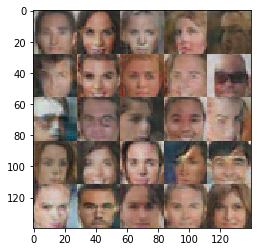

Epoch 4/5... Discriminator Loss: 0.4650... Generator Loss: 7.0080
Epoch 4/5... Discriminator Loss: 0.5488... Generator Loss: 3.8494
Epoch 4/5... Discriminator Loss: 0.3997... Generator Loss: 5.7063
Epoch 4/5... Discriminator Loss: 0.3146... Generator Loss: 4.0491
Epoch 4/5... Discriminator Loss: 0.3764... Generator Loss: 5.5562
Epoch 4/5... Discriminator Loss: 0.2827... Generator Loss: 4.3758
Epoch 4/5... Discriminator Loss: 0.3526... Generator Loss: 4.4076
Epoch 4/5... Discriminator Loss: 0.3829... Generator Loss: 5.2610
Epoch 4/5... Discriminator Loss: 0.3911... Generator Loss: 4.3900
Epoch 4/5... Discriminator Loss: 0.3500... Generator Loss: 4.3973


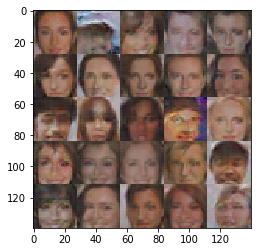

Epoch 4/5... Discriminator Loss: 0.3614... Generator Loss: 5.3101
Epoch 4/5... Discriminator Loss: 0.6838... Generator Loss: 5.0818
Epoch 4/5... Discriminator Loss: 0.2422... Generator Loss: 4.1746
Epoch 4/5... Discriminator Loss: 0.3929... Generator Loss: 4.6699
Epoch 4/5... Discriminator Loss: 0.4523... Generator Loss: 4.5274
Epoch 4/5... Discriminator Loss: 0.3443... Generator Loss: 4.1115
Epoch 4/5... Discriminator Loss: 0.3008... Generator Loss: 4.6201
Epoch 4/5... Discriminator Loss: 0.3322... Generator Loss: 3.4186
Epoch 4/5... Discriminator Loss: 0.2519... Generator Loss: 4.2289
Epoch 4/5... Discriminator Loss: 0.1639... Generator Loss: 4.7299


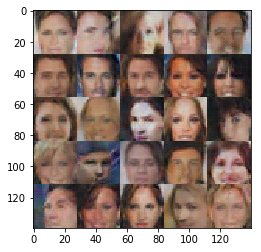

Epoch 4/5... Discriminator Loss: 0.5945... Generator Loss: 2.6841
Epoch 4/5... Discriminator Loss: 0.2456... Generator Loss: 3.6153
Epoch 4/5... Discriminator Loss: 0.1223... Generator Loss: 5.2929
Epoch 4/5... Discriminator Loss: 0.2037... Generator Loss: 4.2714
Epoch 4/5... Discriminator Loss: 0.3304... Generator Loss: 3.7397
Epoch 4/5... Discriminator Loss: 0.3963... Generator Loss: 3.9814
Epoch 4/5... Discriminator Loss: 0.5110... Generator Loss: 5.0244
Epoch 4/5... Discriminator Loss: 0.3931... Generator Loss: 4.1096
Epoch 4/5... Discriminator Loss: 0.3416... Generator Loss: 4.2776
Epoch 4/5... Discriminator Loss: 0.4236... Generator Loss: 4.5908


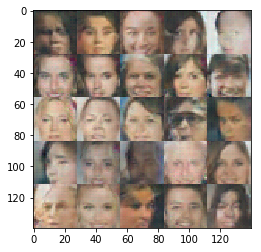

Epoch 4/5... Discriminator Loss: 0.3892... Generator Loss: 3.9390
Epoch 4/5... Discriminator Loss: 0.1945... Generator Loss: 4.2952
Epoch 4/5... Discriminator Loss: 0.1901... Generator Loss: 4.0109
Epoch 4/5... Discriminator Loss: 0.3597... Generator Loss: 3.8610
Epoch 4/5... Discriminator Loss: 0.8738... Generator Loss: 7.3012
Epoch 4/5... Discriminator Loss: 0.2702... Generator Loss: 4.0835
Epoch 4/5... Discriminator Loss: 0.8075... Generator Loss: 3.5839
Epoch 4/5... Discriminator Loss: 0.3936... Generator Loss: 4.9182
Epoch 4/5... Discriminator Loss: 0.3724... Generator Loss: 4.2127
Epoch 4/5... Discriminator Loss: 0.1558... Generator Loss: 4.0734


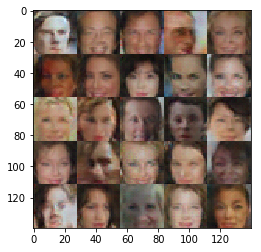

Epoch 4/5... Discriminator Loss: 0.5546... Generator Loss: 3.0769
Epoch 4/5... Discriminator Loss: 0.4885... Generator Loss: 3.9105
Epoch 4/5... Discriminator Loss: 0.2187... Generator Loss: 3.8329
Epoch 4/5... Discriminator Loss: 0.2617... Generator Loss: 3.9640
Epoch 4/5... Discriminator Loss: 0.3489... Generator Loss: 4.3282
Epoch 4/5... Discriminator Loss: 0.7100... Generator Loss: 4.3646
Epoch 4/5... Discriminator Loss: 0.2243... Generator Loss: 4.3482
Epoch 4/5... Discriminator Loss: 0.8298... Generator Loss: 3.3113
Epoch 4/5... Discriminator Loss: 0.4423... Generator Loss: 6.1797
Epoch 4/5... Discriminator Loss: 0.3110... Generator Loss: 4.9556


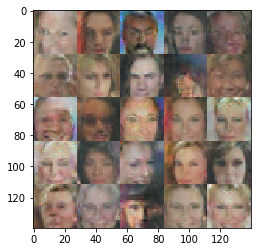

Epoch 4/5... Discriminator Loss: 0.2583... Generator Loss: 4.2814
Epoch 4/5... Discriminator Loss: 0.5730... Generator Loss: 3.8017
Epoch 4/5... Discriminator Loss: 0.1717... Generator Loss: 5.7058
Epoch 4/5... Discriminator Loss: 0.1803... Generator Loss: 4.8421
Epoch 4/5... Discriminator Loss: 0.2978... Generator Loss: 4.7711
Epoch 4/5... Discriminator Loss: 0.1228... Generator Loss: 4.1849
Epoch 4/5... Discriminator Loss: 0.3332... Generator Loss: 4.3054
Epoch 4/5... Discriminator Loss: 0.3160... Generator Loss: 3.5038
Epoch 4/5... Discriminator Loss: 0.2741... Generator Loss: 4.1113
Epoch 4/5... Discriminator Loss: 0.4954... Generator Loss: 5.3881


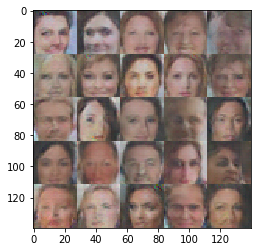

Epoch 4/5... Discriminator Loss: 1.1689... Generator Loss: 6.0096
Epoch 4/5... Discriminator Loss: 0.1515... Generator Loss: 4.3912
Epoch 4/5... Discriminator Loss: 0.2435... Generator Loss: 3.7408
Epoch 4/5... Discriminator Loss: 0.1776... Generator Loss: 3.9013
Epoch 4/5... Discriminator Loss: 0.0867... Generator Loss: 4.4066
Epoch 4/5... Discriminator Loss: 0.5965... Generator Loss: 2.8618
Epoch 4/5... Discriminator Loss: 1.4242... Generator Loss: 8.5469
Epoch 4/5... Discriminator Loss: 0.4474... Generator Loss: 3.9638
Epoch 4/5... Discriminator Loss: 0.5512... Generator Loss: 4.2065
Epoch 4/5... Discriminator Loss: 0.4115... Generator Loss: 4.4427


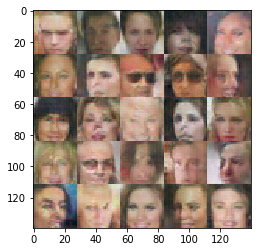

Epoch 4/5... Discriminator Loss: 0.6106... Generator Loss: 3.3935
Epoch 4/5... Discriminator Loss: 0.3274... Generator Loss: 3.6105
Epoch 4/5... Discriminator Loss: 0.5823... Generator Loss: 3.7719
Epoch 4/5... Discriminator Loss: 0.2678... Generator Loss: 3.2626
Epoch 4/5... Discriminator Loss: 0.3934... Generator Loss: 4.5575
Epoch 4/5... Discriminator Loss: 0.2402... Generator Loss: 4.1334
Epoch 4/5... Discriminator Loss: 0.3527... Generator Loss: 3.9065
Epoch 4/5... Discriminator Loss: 0.7009... Generator Loss: 2.9592
Epoch 4/5... Discriminator Loss: 0.4670... Generator Loss: 3.2720
Epoch 4/5... Discriminator Loss: 0.3680... Generator Loss: 4.0298


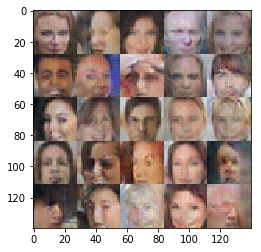

Epoch 4/5... Discriminator Loss: 0.1936... Generator Loss: 4.5758
Epoch 4/5... Discriminator Loss: 0.1180... Generator Loss: 3.7790
Epoch 4/5... Discriminator Loss: 0.3650... Generator Loss: 2.9968
Epoch 4/5... Discriminator Loss: 0.2475... Generator Loss: 5.5310
Epoch 4/5... Discriminator Loss: 0.3367... Generator Loss: 2.8749
Epoch 4/5... Discriminator Loss: 0.6601... Generator Loss: 3.0811
Epoch 4/5... Discriminator Loss: 0.1442... Generator Loss: 3.8117
Epoch 4/5... Discriminator Loss: 0.4719... Generator Loss: 4.9094
Epoch 4/5... Discriminator Loss: 0.3021... Generator Loss: 3.8999
Epoch 4/5... Discriminator Loss: 0.2175... Generator Loss: 4.0347


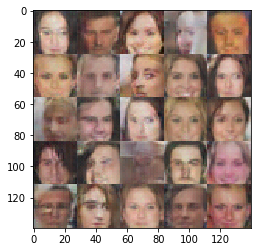

Epoch 4/5... Discriminator Loss: 0.2831... Generator Loss: 4.3944
Epoch 4/5... Discriminator Loss: 0.2129... Generator Loss: 4.2326
Epoch 4/5... Discriminator Loss: 0.3778... Generator Loss: 4.3793
Epoch 4/5... Discriminator Loss: 0.1619... Generator Loss: 4.7273
Epoch 4/5... Discriminator Loss: 0.3146... Generator Loss: 3.7443
Epoch 4/5... Discriminator Loss: 0.3213... Generator Loss: 5.3187
Epoch 4/5... Discriminator Loss: 0.1622... Generator Loss: 4.0959
Epoch 4/5... Discriminator Loss: 0.5488... Generator Loss: 3.8018
Epoch 4/5... Discriminator Loss: 0.7200... Generator Loss: 4.0805
Epoch 4/5... Discriminator Loss: 0.1676... Generator Loss: 4.5324


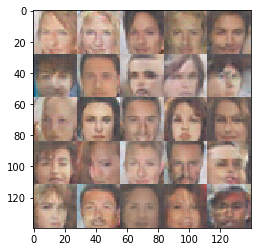

Epoch 4/5... Discriminator Loss: 0.1510... Generator Loss: 4.9642
Epoch 4/5... Discriminator Loss: 0.1976... Generator Loss: 4.4247
Epoch 4/5... Discriminator Loss: 0.2126... Generator Loss: 4.2341
Epoch 4/5... Discriminator Loss: 0.2704... Generator Loss: 4.3227
Epoch 4/5... Discriminator Loss: 0.4033... Generator Loss: 4.2538
Epoch 4/5... Discriminator Loss: 0.2315... Generator Loss: 3.7115
Epoch 4/5... Discriminator Loss: 0.2054... Generator Loss: 4.0066
Epoch 4/5... Discriminator Loss: 0.2654... Generator Loss: 4.1640
Epoch 4/5... Discriminator Loss: 0.2726... Generator Loss: 3.8454
Epoch 4/5... Discriminator Loss: 0.2912... Generator Loss: 4.1059


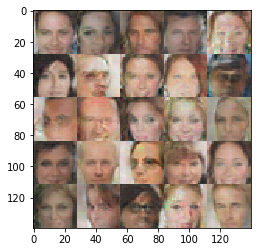

Epoch 4/5... Discriminator Loss: 0.5016... Generator Loss: 5.7388
Epoch 4/5... Discriminator Loss: 0.3120... Generator Loss: 5.2114
Epoch 4/5... Discriminator Loss: 0.3018... Generator Loss: 3.1985
Epoch 4/5... Discriminator Loss: 0.4810... Generator Loss: 2.9674
Epoch 4/5... Discriminator Loss: 0.2171... Generator Loss: 4.6491
Epoch 4/5... Discriminator Loss: 0.3464... Generator Loss: 4.1385
Epoch 5/5... Discriminator Loss: 0.3483... Generator Loss: 3.8049
Epoch 5/5... Discriminator Loss: 0.1299... Generator Loss: 5.0105
Epoch 5/5... Discriminator Loss: 0.2274... Generator Loss: 4.3706
Epoch 5/5... Discriminator Loss: 0.3272... Generator Loss: 3.8367


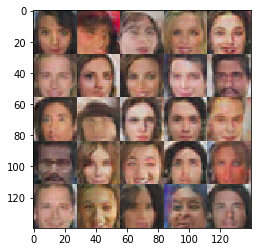

Epoch 5/5... Discriminator Loss: 1.0436... Generator Loss: 4.9848
Epoch 5/5... Discriminator Loss: 0.2510... Generator Loss: 4.8384
Epoch 5/5... Discriminator Loss: 0.4808... Generator Loss: 3.6407
Epoch 5/5... Discriminator Loss: 0.1549... Generator Loss: 4.7050
Epoch 5/5... Discriminator Loss: 0.2766... Generator Loss: 2.9311
Epoch 5/5... Discriminator Loss: 0.2118... Generator Loss: 3.5051
Epoch 5/5... Discriminator Loss: 0.2773... Generator Loss: 4.4992
Epoch 5/5... Discriminator Loss: 0.3514... Generator Loss: 3.7058
Epoch 5/5... Discriminator Loss: 0.2719... Generator Loss: 4.4682
Epoch 5/5... Discriminator Loss: 0.4972... Generator Loss: 3.6452


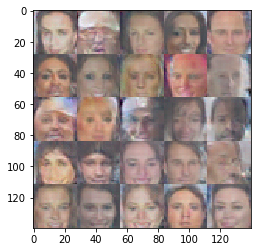

Epoch 5/5... Discriminator Loss: 0.2602... Generator Loss: 4.1727
Epoch 5/5... Discriminator Loss: 0.4262... Generator Loss: 3.4714
Epoch 5/5... Discriminator Loss: 1.4286... Generator Loss: 4.4214
Epoch 5/5... Discriminator Loss: 0.5926... Generator Loss: 5.0897
Epoch 5/5... Discriminator Loss: 0.2943... Generator Loss: 3.1344
Epoch 5/5... Discriminator Loss: 0.7707... Generator Loss: 6.0977
Epoch 5/5... Discriminator Loss: 0.2699... Generator Loss: 3.7902
Epoch 5/5... Discriminator Loss: 0.5861... Generator Loss: 3.8530
Epoch 5/5... Discriminator Loss: 0.9816... Generator Loss: 2.7289
Epoch 5/5... Discriminator Loss: 0.2000... Generator Loss: 4.3305


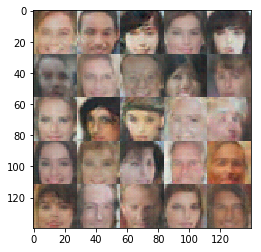

Epoch 5/5... Discriminator Loss: 1.0607... Generator Loss: 6.7604
Epoch 5/5... Discriminator Loss: 0.3172... Generator Loss: 3.3431
Epoch 5/5... Discriminator Loss: 0.4079... Generator Loss: 4.3631
Epoch 5/5... Discriminator Loss: 0.5516... Generator Loss: 4.0311
Epoch 5/5... Discriminator Loss: 0.1398... Generator Loss: 4.2346
Epoch 5/5... Discriminator Loss: 0.4337... Generator Loss: 4.1891
Epoch 5/5... Discriminator Loss: 0.2399... Generator Loss: 4.0736
Epoch 5/5... Discriminator Loss: 0.4163... Generator Loss: 3.3867
Epoch 5/5... Discriminator Loss: 0.3239... Generator Loss: 3.5204
Epoch 5/5... Discriminator Loss: 0.0707... Generator Loss: 5.5690


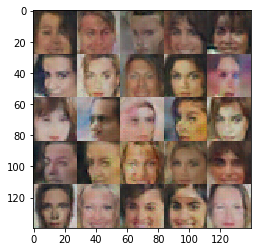

Epoch 5/5... Discriminator Loss: 0.2737... Generator Loss: 3.8746
Epoch 5/5... Discriminator Loss: 0.1944... Generator Loss: 4.8819
Epoch 5/5... Discriminator Loss: 0.2936... Generator Loss: 4.3234
Epoch 5/5... Discriminator Loss: 0.5984... Generator Loss: 5.9334
Epoch 5/5... Discriminator Loss: 0.6675... Generator Loss: 5.1097
Epoch 5/5... Discriminator Loss: 0.3717... Generator Loss: 4.0297
Epoch 5/5... Discriminator Loss: 0.1888... Generator Loss: 5.2707
Epoch 5/5... Discriminator Loss: 0.1887... Generator Loss: 4.9261
Epoch 5/5... Discriminator Loss: 0.6196... Generator Loss: 7.0448
Epoch 5/5... Discriminator Loss: 0.5240... Generator Loss: 3.2156


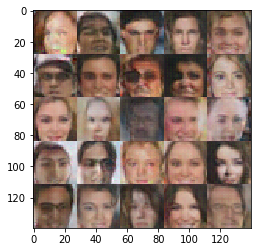

Epoch 5/5... Discriminator Loss: 0.5207... Generator Loss: 4.4119
Epoch 5/5... Discriminator Loss: 0.1633... Generator Loss: 4.4963
Epoch 5/5... Discriminator Loss: 0.2491... Generator Loss: 6.2222
Epoch 5/5... Discriminator Loss: 0.1645... Generator Loss: 4.6379
Epoch 5/5... Discriminator Loss: 0.1372... Generator Loss: 5.5062
Epoch 5/5... Discriminator Loss: 0.1847... Generator Loss: 4.1133
Epoch 5/5... Discriminator Loss: 0.1575... Generator Loss: 4.3104
Epoch 5/5... Discriminator Loss: 0.4179... Generator Loss: 4.3260
Epoch 5/5... Discriminator Loss: 0.3961... Generator Loss: 4.4992
Epoch 5/5... Discriminator Loss: 0.4434... Generator Loss: 4.4217


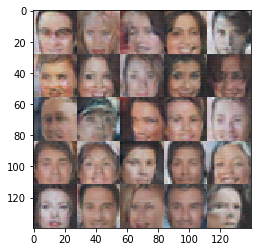

Epoch 5/5... Discriminator Loss: 0.3028... Generator Loss: 4.8966
Epoch 5/5... Discriminator Loss: 0.1592... Generator Loss: 4.0733
Epoch 5/5... Discriminator Loss: 0.5320... Generator Loss: 4.5898
Epoch 5/5... Discriminator Loss: 0.1782... Generator Loss: 3.6677
Epoch 5/5... Discriminator Loss: 0.2536... Generator Loss: 5.0219
Epoch 5/5... Discriminator Loss: 0.1496... Generator Loss: 5.2915
Epoch 5/5... Discriminator Loss: 0.1273... Generator Loss: 5.7705
Epoch 5/5... Discriminator Loss: 0.1089... Generator Loss: 4.8026
Epoch 5/5... Discriminator Loss: 0.4250... Generator Loss: 6.5863
Epoch 5/5... Discriminator Loss: 0.1880... Generator Loss: 4.5488


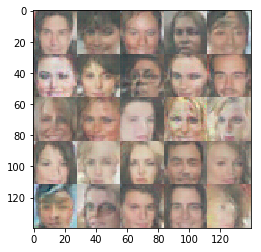

Epoch 5/5... Discriminator Loss: 0.0745... Generator Loss: 4.7804
Epoch 5/5... Discriminator Loss: 0.5864... Generator Loss: 2.9389
Epoch 5/5... Discriminator Loss: 0.2697... Generator Loss: 4.0892
Epoch 5/5... Discriminator Loss: 0.3661... Generator Loss: 5.6589
Epoch 5/5... Discriminator Loss: 0.2693... Generator Loss: 4.3990
Epoch 5/5... Discriminator Loss: 0.1888... Generator Loss: 4.3866
Epoch 5/5... Discriminator Loss: 0.1225... Generator Loss: 3.7290
Epoch 5/5... Discriminator Loss: 0.7624... Generator Loss: 3.2850
Epoch 5/5... Discriminator Loss: 0.3032... Generator Loss: 4.7166
Epoch 5/5... Discriminator Loss: 0.2882... Generator Loss: 6.1223


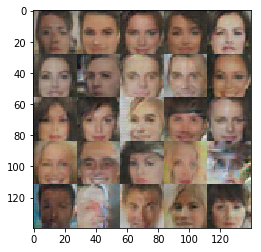

Epoch 5/5... Discriminator Loss: 0.6214... Generator Loss: 4.5836
Epoch 5/5... Discriminator Loss: 0.1034... Generator Loss: 5.2774
Epoch 5/5... Discriminator Loss: 0.2874... Generator Loss: 5.5999
Epoch 5/5... Discriminator Loss: 0.1808... Generator Loss: 4.2053
Epoch 5/5... Discriminator Loss: 0.1951... Generator Loss: 4.4592
Epoch 5/5... Discriminator Loss: 0.1702... Generator Loss: 4.2134
Epoch 5/5... Discriminator Loss: 0.4383... Generator Loss: 3.7625
Epoch 5/5... Discriminator Loss: 0.2233... Generator Loss: 4.3883
Epoch 5/5... Discriminator Loss: 0.3485... Generator Loss: 4.4355
Epoch 5/5... Discriminator Loss: 0.2285... Generator Loss: 4.6753


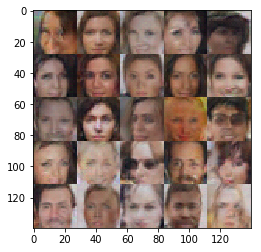

Epoch 5/5... Discriminator Loss: 0.5332... Generator Loss: 4.1558
Epoch 5/5... Discriminator Loss: 0.3948... Generator Loss: 4.2085
Epoch 5/5... Discriminator Loss: 0.2734... Generator Loss: 6.3331
Epoch 5/5... Discriminator Loss: 0.6416... Generator Loss: 8.3298
Epoch 5/5... Discriminator Loss: 0.4873... Generator Loss: 5.3440
Epoch 5/5... Discriminator Loss: 0.2552... Generator Loss: 4.5187
Epoch 5/5... Discriminator Loss: 0.1193... Generator Loss: 6.3438
Epoch 5/5... Discriminator Loss: 0.3934... Generator Loss: 4.4313
Epoch 5/5... Discriminator Loss: 0.2648... Generator Loss: 4.0842
Epoch 5/5... Discriminator Loss: 0.6056... Generator Loss: 7.0476


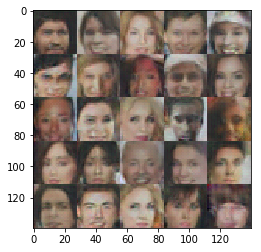

Epoch 5/5... Discriminator Loss: 0.4628... Generator Loss: 5.1670
Epoch 5/5... Discriminator Loss: 0.3689... Generator Loss: 4.6742
Epoch 5/5... Discriminator Loss: 0.5161... Generator Loss: 3.2403
Epoch 5/5... Discriminator Loss: 0.4830... Generator Loss: 3.2766
Epoch 5/5... Discriminator Loss: 0.2351... Generator Loss: 3.7442
Epoch 5/5... Discriminator Loss: 0.7181... Generator Loss: 4.4600
Epoch 5/5... Discriminator Loss: 0.3279... Generator Loss: 4.7962
Epoch 5/5... Discriminator Loss: 0.4382... Generator Loss: 5.4288
Epoch 5/5... Discriminator Loss: 0.4062... Generator Loss: 3.8346
Epoch 5/5... Discriminator Loss: 0.1375... Generator Loss: 4.1534


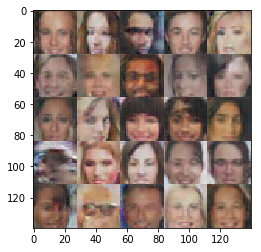

Epoch 5/5... Discriminator Loss: 0.0953... Generator Loss: 4.9916
Epoch 5/5... Discriminator Loss: 0.2188... Generator Loss: 4.1748
Epoch 5/5... Discriminator Loss: 0.3996... Generator Loss: 4.4457
Epoch 5/5... Discriminator Loss: 0.5218... Generator Loss: 4.5268
Epoch 5/5... Discriminator Loss: 0.2997... Generator Loss: 4.4032
Epoch 5/5... Discriminator Loss: 0.4416... Generator Loss: 3.4557
Epoch 5/5... Discriminator Loss: 0.1180... Generator Loss: 5.0637
Epoch 5/5... Discriminator Loss: 0.2963... Generator Loss: 3.6523
Epoch 5/5... Discriminator Loss: 0.1553... Generator Loss: 3.9292
Epoch 5/5... Discriminator Loss: 0.1108... Generator Loss: 4.6026


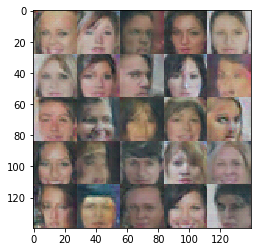

Epoch 5/5... Discriminator Loss: 0.5938... Generator Loss: 4.4551
Epoch 5/5... Discriminator Loss: 0.2876... Generator Loss: 3.5778
Epoch 5/5... Discriminator Loss: 0.2132... Generator Loss: 4.3566
Epoch 5/5... Discriminator Loss: 0.2236... Generator Loss: 4.0560
Epoch 5/5... Discriminator Loss: 0.5899... Generator Loss: 3.6332
Epoch 5/5... Discriminator Loss: 0.1628... Generator Loss: 5.2368
Epoch 5/5... Discriminator Loss: 0.4997... Generator Loss: 4.7920
Epoch 5/5... Discriminator Loss: 0.1597... Generator Loss: 4.5002
Epoch 5/5... Discriminator Loss: 0.1481... Generator Loss: 4.4095
Epoch 5/5... Discriminator Loss: 0.2340... Generator Loss: 4.3183


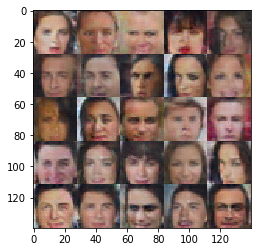

Epoch 5/5... Discriminator Loss: 0.1876... Generator Loss: 3.7631
Epoch 5/5... Discriminator Loss: 0.2062... Generator Loss: 4.1746
Epoch 5/5... Discriminator Loss: 0.4260... Generator Loss: 5.1036
Epoch 5/5... Discriminator Loss: 0.1400... Generator Loss: 5.4353
Epoch 5/5... Discriminator Loss: 0.4258... Generator Loss: 4.4990
Epoch 5/5... Discriminator Loss: 0.2717... Generator Loss: 4.6213
Epoch 5/5... Discriminator Loss: 0.5648... Generator Loss: 4.8706
Epoch 5/5... Discriminator Loss: 0.2679... Generator Loss: 4.8073
Epoch 5/5... Discriminator Loss: 0.3778... Generator Loss: 5.7764
Epoch 5/5... Discriminator Loss: 0.0743... Generator Loss: 5.1383


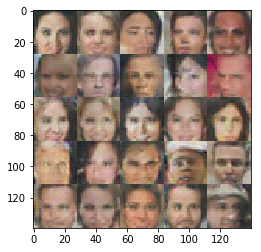

Epoch 5/5... Discriminator Loss: 0.1152... Generator Loss: 4.6812
Epoch 5/5... Discriminator Loss: 0.6897... Generator Loss: 2.8176
Epoch 5/5... Discriminator Loss: 0.2975... Generator Loss: 4.5397
Epoch 5/5... Discriminator Loss: 0.0857... Generator Loss: 4.7668
Epoch 5/5... Discriminator Loss: 0.1261... Generator Loss: 5.1578
Epoch 5/5... Discriminator Loss: 0.2066... Generator Loss: 4.1964
Epoch 5/5... Discriminator Loss: 0.1851... Generator Loss: 3.9897
Epoch 5/5... Discriminator Loss: 0.2964... Generator Loss: 3.9505
Epoch 5/5... Discriminator Loss: 0.1452... Generator Loss: 3.8591
Epoch 5/5... Discriminator Loss: 0.3552... Generator Loss: 4.6834


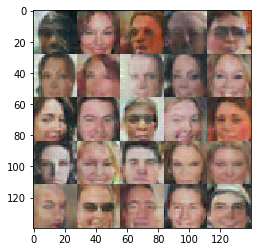

Epoch 5/5... Discriminator Loss: 0.2626... Generator Loss: 3.6469
Epoch 5/5... Discriminator Loss: 0.1751... Generator Loss: 4.3895
Epoch 5/5... Discriminator Loss: 0.5175... Generator Loss: 6.2684
Epoch 5/5... Discriminator Loss: 0.3356... Generator Loss: 5.8090
Epoch 5/5... Discriminator Loss: 0.3013... Generator Loss: 5.6597
Epoch 5/5... Discriminator Loss: 0.3284... Generator Loss: 5.1188
Epoch 5/5... Discriminator Loss: 0.3107... Generator Loss: 4.1175
Epoch 5/5... Discriminator Loss: 0.6495... Generator Loss: 4.2645
Epoch 5/5... Discriminator Loss: 0.3236... Generator Loss: 5.7473
Epoch 5/5... Discriminator Loss: 0.6321... Generator Loss: 3.9162


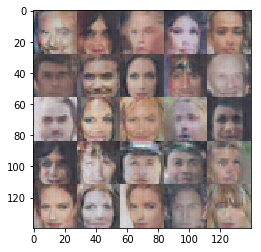

Epoch 5/5... Discriminator Loss: 0.3858... Generator Loss: 3.7029
Epoch 5/5... Discriminator Loss: 0.3863... Generator Loss: 4.7775
Epoch 5/5... Discriminator Loss: 0.3544... Generator Loss: 4.1801
Epoch 5/5... Discriminator Loss: 0.2186... Generator Loss: 3.9880
Epoch 5/5... Discriminator Loss: 0.4153... Generator Loss: 5.5498
Epoch 5/5... Discriminator Loss: 0.1159... Generator Loss: 5.2771
Epoch 5/5... Discriminator Loss: 0.3906... Generator Loss: 4.2442
Epoch 5/5... Discriminator Loss: 0.4248... Generator Loss: 5.3224
Epoch 5/5... Discriminator Loss: 0.2271... Generator Loss: 4.7870
Epoch 5/5... Discriminator Loss: 0.8801... Generator Loss: 6.6238


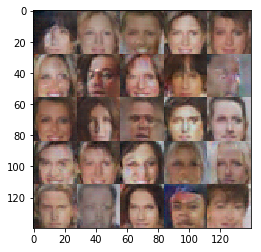

Epoch 5/5... Discriminator Loss: 0.5767... Generator Loss: 5.4935
Epoch 5/5... Discriminator Loss: 0.1782... Generator Loss: 3.8750
Epoch 5/5... Discriminator Loss: 0.2381... Generator Loss: 5.6308
Epoch 5/5... Discriminator Loss: 0.1472... Generator Loss: 5.3624
Epoch 5/5... Discriminator Loss: 0.4711... Generator Loss: 4.3543
Epoch 5/5... Discriminator Loss: 0.2279... Generator Loss: 4.2104
Epoch 5/5... Discriminator Loss: 0.1832... Generator Loss: 7.7411
Epoch 5/5... Discriminator Loss: 0.2948... Generator Loss: 4.3439
Epoch 5/5... Discriminator Loss: 0.8500... Generator Loss: 4.6987
Epoch 5/5... Discriminator Loss: 0.2066... Generator Loss: 4.6403


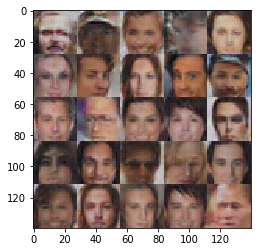

Epoch 5/5... Discriminator Loss: 0.0607... Generator Loss: 5.9875
Epoch 5/5... Discriminator Loss: 0.3161... Generator Loss: 4.9770
Epoch 5/5... Discriminator Loss: 0.1204... Generator Loss: 6.1910
Epoch 5/5... Discriminator Loss: 0.2977... Generator Loss: 3.2611
Epoch 5/5... Discriminator Loss: 0.1497... Generator Loss: 5.2449
Epoch 5/5... Discriminator Loss: 0.2543... Generator Loss: 6.0256
Epoch 5/5... Discriminator Loss: 0.2651... Generator Loss: 5.1218
Epoch 5/5... Discriminator Loss: 0.2591... Generator Loss: 4.6741
Epoch 5/5... Discriminator Loss: 0.5351... Generator Loss: 3.1873
Epoch 5/5... Discriminator Loss: 0.1737... Generator Loss: 4.7640


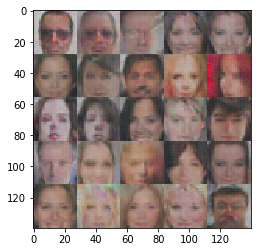

Epoch 5/5... Discriminator Loss: 0.1598... Generator Loss: 6.2059
Epoch 5/5... Discriminator Loss: 0.2818... Generator Loss: 4.4496
Epoch 5/5... Discriminator Loss: 0.2050... Generator Loss: 6.7608
Epoch 5/5... Discriminator Loss: 0.1502... Generator Loss: 4.3681
Epoch 5/5... Discriminator Loss: 0.2341... Generator Loss: 4.2794
Epoch 5/5... Discriminator Loss: 0.2496... Generator Loss: 4.4422
Epoch 5/5... Discriminator Loss: 0.0953... Generator Loss: 5.0899
Epoch 5/5... Discriminator Loss: 0.3294... Generator Loss: 5.1199
Epoch 5/5... Discriminator Loss: 0.1225... Generator Loss: 5.3268
Epoch 5/5... Discriminator Loss: 0.5456... Generator Loss: 3.2446


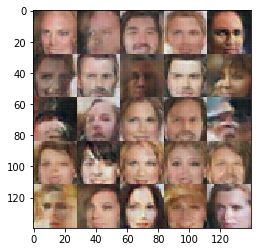

Epoch 5/5... Discriminator Loss: 0.4234... Generator Loss: 5.0140
Epoch 5/5... Discriminator Loss: 0.5549... Generator Loss: 5.0717
Epoch 5/5... Discriminator Loss: 0.2585... Generator Loss: 5.7750
Epoch 5/5... Discriminator Loss: 0.1997... Generator Loss: 5.3204
Epoch 5/5... Discriminator Loss: 0.3760... Generator Loss: 5.0684
Epoch 5/5... Discriminator Loss: 0.4748... Generator Loss: 5.7575
Epoch 5/5... Discriminator Loss: 0.1729... Generator Loss: 5.2628
Epoch 5/5... Discriminator Loss: 0.1164... Generator Loss: 4.8692
Epoch 5/5... Discriminator Loss: 0.1492... Generator Loss: 4.1082
Epoch 5/5... Discriminator Loss: 0.0774... Generator Loss: 5.4079


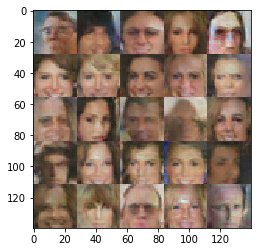

Epoch 5/5... Discriminator Loss: 0.3547... Generator Loss: 7.7652
Epoch 5/5... Discriminator Loss: 0.2389... Generator Loss: 5.6328
Epoch 5/5... Discriminator Loss: 0.7359... Generator Loss: 5.3869
Epoch 5/5... Discriminator Loss: 0.0647... Generator Loss: 5.5756
Epoch 5/5... Discriminator Loss: 0.3728... Generator Loss: 4.4732
Epoch 5/5... Discriminator Loss: 0.3087... Generator Loss: 5.6545
Epoch 5/5... Discriminator Loss: 0.2819... Generator Loss: 3.7220
Epoch 5/5... Discriminator Loss: 0.5743... Generator Loss: 3.2627
Epoch 5/5... Discriminator Loss: 0.1696... Generator Loss: 3.5663
Epoch 5/5... Discriminator Loss: 0.2504... Generator Loss: 4.8030


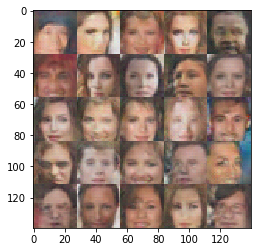

Epoch 5/5... Discriminator Loss: 0.2219... Generator Loss: 4.7435
Epoch 5/5... Discriminator Loss: 0.1780... Generator Loss: 4.0183
Epoch 5/5... Discriminator Loss: 0.3532... Generator Loss: 3.0234
Epoch 5/5... Discriminator Loss: 0.2324... Generator Loss: 4.6871
Epoch 5/5... Discriminator Loss: 0.3251... Generator Loss: 3.7685
Epoch 5/5... Discriminator Loss: 0.1476... Generator Loss: 5.7416
Epoch 5/5... Discriminator Loss: 0.2021... Generator Loss: 4.4130
Epoch 5/5... Discriminator Loss: 0.1372... Generator Loss: 4.1100
Epoch 5/5... Discriminator Loss: 0.3335... Generator Loss: 3.2570
Epoch 5/5... Discriminator Loss: 0.7605... Generator Loss: 4.1184


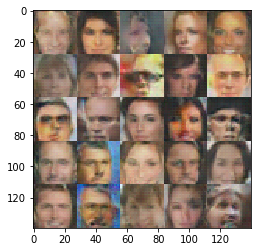

Epoch 5/5... Discriminator Loss: 0.1530... Generator Loss: 5.0252
Epoch 5/5... Discriminator Loss: 0.1358... Generator Loss: 5.0762
Epoch 5/5... Discriminator Loss: 0.3886... Generator Loss: 4.9201
Epoch 5/5... Discriminator Loss: 0.4407... Generator Loss: 3.4380
Epoch 5/5... Discriminator Loss: 0.1804... Generator Loss: 4.4270
Epoch 5/5... Discriminator Loss: 0.2846... Generator Loss: 4.0468
Epoch 5/5... Discriminator Loss: 0.7020... Generator Loss: 5.5374
Epoch 5/5... Discriminator Loss: 0.2215... Generator Loss: 5.1898
Epoch 5/5... Discriminator Loss: 0.4553... Generator Loss: 4.2089
Epoch 5/5... Discriminator Loss: 0.3592... Generator Loss: 6.5827


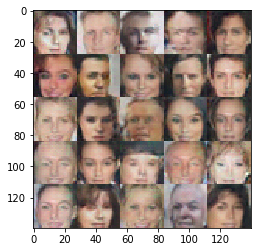

Epoch 5/5... Discriminator Loss: 0.2030... Generator Loss: 4.6934
Epoch 5/5... Discriminator Loss: 0.3119... Generator Loss: 5.8759
Epoch 5/5... Discriminator Loss: 0.0690... Generator Loss: 4.6684
Epoch 5/5... Discriminator Loss: 0.1479... Generator Loss: 4.3009
Epoch 5/5... Discriminator Loss: 0.0898... Generator Loss: 4.8185
Epoch 5/5... Discriminator Loss: 0.2941... Generator Loss: 4.1634
Epoch 5/5... Discriminator Loss: 0.2316... Generator Loss: 3.5211
Epoch 5/5... Discriminator Loss: 0.6754... Generator Loss: 7.9182
Epoch 5/5... Discriminator Loss: 0.2087... Generator Loss: 4.1842
Epoch 5/5... Discriminator Loss: 0.2068... Generator Loss: 3.5780


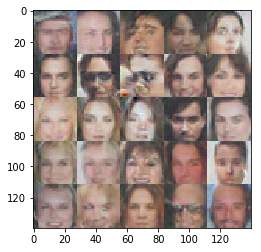

Epoch 5/5... Discriminator Loss: 0.9444... Generator Loss: 3.8946
Epoch 5/5... Discriminator Loss: 0.0917... Generator Loss: 5.3433
Epoch 5/5... Discriminator Loss: 0.1317... Generator Loss: 5.1664
Epoch 5/5... Discriminator Loss: 0.2355... Generator Loss: 5.2769
Epoch 5/5... Discriminator Loss: 0.1605... Generator Loss: 4.7054
Epoch 5/5... Discriminator Loss: 0.1160... Generator Loss: 6.2186
Epoch 5/5... Discriminator Loss: 0.9580... Generator Loss: 2.8502
Epoch 5/5... Discriminator Loss: 0.0867... Generator Loss: 4.7297
Epoch 5/5... Discriminator Loss: 0.2979... Generator Loss: 5.3084
Epoch 5/5... Discriminator Loss: 0.1172... Generator Loss: 4.2554


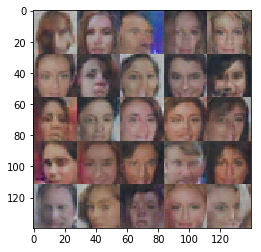

Epoch 5/5... Discriminator Loss: 0.3814... Generator Loss: 6.6012
Epoch 5/5... Discriminator Loss: 0.2428... Generator Loss: 5.2877
Epoch 5/5... Discriminator Loss: 0.2479... Generator Loss: 3.3056
Epoch 5/5... Discriminator Loss: 0.1280... Generator Loss: 6.0261
Epoch 5/5... Discriminator Loss: 0.2074... Generator Loss: 5.1331
Epoch 5/5... Discriminator Loss: 0.0762... Generator Loss: 4.7899
Epoch 5/5... Discriminator Loss: 0.2604... Generator Loss: 4.5161
Epoch 5/5... Discriminator Loss: 0.3309... Generator Loss: 5.6782
Epoch 5/5... Discriminator Loss: 0.2110... Generator Loss: 4.7789
Epoch 5/5... Discriminator Loss: 0.2617... Generator Loss: 4.5630


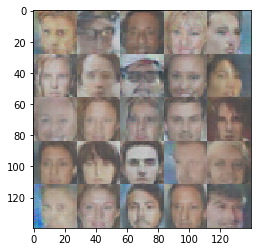

Epoch 5/5... Discriminator Loss: 0.4082... Generator Loss: 4.1856
Epoch 5/5... Discriminator Loss: 0.4682... Generator Loss: 4.9557
Epoch 5/5... Discriminator Loss: 0.0973... Generator Loss: 4.4524
Epoch 5/5... Discriminator Loss: 0.2059... Generator Loss: 5.4591
Epoch 5/5... Discriminator Loss: 0.1210... Generator Loss: 4.1425
Epoch 5/5... Discriminator Loss: 0.7877... Generator Loss: 3.7615
Epoch 5/5... Discriminator Loss: 0.0741... Generator Loss: 4.6082
Epoch 5/5... Discriminator Loss: 0.3043... Generator Loss: 5.7355
Epoch 5/5... Discriminator Loss: 0.3894... Generator Loss: 4.1914
Epoch 5/5... Discriminator Loss: 0.6718... Generator Loss: 6.4196


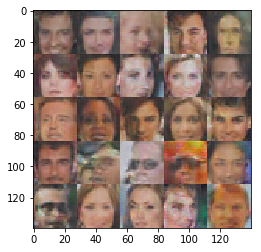

Epoch 5/5... Discriminator Loss: 0.5565... Generator Loss: 5.2030
Epoch 5/5... Discriminator Loss: 0.3185... Generator Loss: 4.4483
Epoch 5/5... Discriminator Loss: 0.2734... Generator Loss: 5.0064
Epoch 5/5... Discriminator Loss: 0.0953... Generator Loss: 4.6551
Epoch 5/5... Discriminator Loss: 0.2034... Generator Loss: 4.5195
Epoch 5/5... Discriminator Loss: 0.2790... Generator Loss: 4.8248
Epoch 5/5... Discriminator Loss: 0.1732... Generator Loss: 6.5474
Epoch 5/5... Discriminator Loss: 0.3000... Generator Loss: 6.4340
Epoch 5/5... Discriminator Loss: 0.0771... Generator Loss: 5.5044
Epoch 5/5... Discriminator Loss: 0.2324... Generator Loss: 4.6768


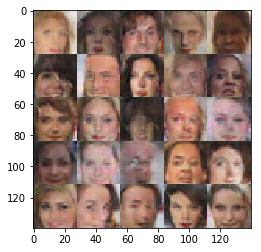

Epoch 5/5... Discriminator Loss: 0.3699... Generator Loss: 5.6487
Epoch 5/5... Discriminator Loss: 0.2268... Generator Loss: 6.4611
Epoch 5/5... Discriminator Loss: 0.0467... Generator Loss: 5.6373
Epoch 5/5... Discriminator Loss: 0.6174... Generator Loss: 7.9073
Epoch 5/5... Discriminator Loss: 0.5311... Generator Loss: 4.9707
Epoch 5/5... Discriminator Loss: 0.3438... Generator Loss: 4.5658
Epoch 5/5... Discriminator Loss: 0.4915... Generator Loss: 8.3964
Epoch 5/5... Discriminator Loss: 0.2035... Generator Loss: 4.6232
Epoch 5/5... Discriminator Loss: 0.2075... Generator Loss: 4.1635
Epoch 5/5... Discriminator Loss: 0.1545... Generator Loss: 5.4579


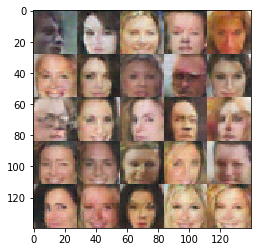

Epoch 5/5... Discriminator Loss: 0.5192... Generator Loss: 3.7154
Epoch 5/5... Discriminator Loss: 0.0765... Generator Loss: 6.3711
Epoch 5/5... Discriminator Loss: 0.8349... Generator Loss: 8.8461
Epoch 5/5... Discriminator Loss: 0.7177... Generator Loss: 9.0768
Epoch 5/5... Discriminator Loss: 0.2347... Generator Loss: 4.1398
Epoch 5/5... Discriminator Loss: 0.2657... Generator Loss: 4.1659
Epoch 5/5... Discriminator Loss: 0.4282... Generator Loss: 5.2987
Epoch 5/5... Discriminator Loss: 0.3040... Generator Loss: 3.6076
Epoch 5/5... Discriminator Loss: 0.1240... Generator Loss: 4.8674
Epoch 5/5... Discriminator Loss: 0.1609... Generator Loss: 4.2647


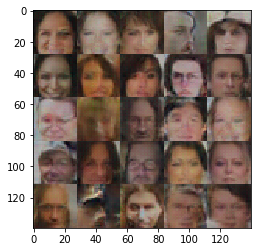

Epoch 5/5... Discriminator Loss: 0.2816... Generator Loss: 4.6723
Epoch 5/5... Discriminator Loss: 0.3228... Generator Loss: 5.4707
Epoch 5/5... Discriminator Loss: 0.2730... Generator Loss: 5.2262
Epoch 5/5... Discriminator Loss: 0.3959... Generator Loss: 3.9157
Epoch 5/5... Discriminator Loss: 0.8199... Generator Loss: 2.9430
Epoch 5/5... Discriminator Loss: 0.4632... Generator Loss: 5.8013
Epoch 5/5... Discriminator Loss: 0.1637... Generator Loss: 4.3725
Epoch 5/5... Discriminator Loss: 0.4523... Generator Loss: 4.8993
Epoch 5/5... Discriminator Loss: 0.1475... Generator Loss: 4.7874
Epoch 5/5... Discriminator Loss: 0.5800... Generator Loss: 3.4268


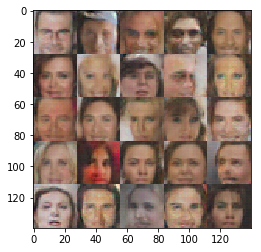

Epoch 5/5... Discriminator Loss: 0.0854... Generator Loss: 4.7450
Epoch 5/5... Discriminator Loss: 0.2758... Generator Loss: 4.8570


In [14]:
batch_size = 64
z_dim = 100
learning_rate = 0.002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.